In [1]:
#!pip install nibabel
#!pip install imageio
#!pip install ipywidgets
#!pip install fastai
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import glob
import nibabel as nib
import cv2
import imageio
from tqdm.notebook import tqdm
from ipywidgets import *
from PIL import Image
from fastai.basics import *
from fastai.vision.all import *
from fastai.data.transforms import *

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Create a meta file for nii files processing

file_list = []
for dirname, _, filenames in os.walk('/kaggle/input/liver-tumor-segmentation'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        file_list.append((dirname,filename)) 

for dirname, _, filenames in os.walk('/kaggle/input/liver-tumor-segmentation-part-2'):
    for filename in filenames:
        file_list.append((dirname,filename)) 

df_files = pd.DataFrame(file_list, columns =['dirname', 'filename']) 
df_files.sort_values(by=['filename'], ascending=True)    

,dirname,filename
89,/kaggle/input/liver-tumor-segmentation/segmentations,segmentation-0.nii
81,/kaggle/input/liver-tumor-segmentation/segmentations,segmentation-1.nii
142,/kaggle/input/liver-tumor-segmentation/segmentations,segmentation-10.nii
31,/kaggle/input/liver-tumor-segmentation/segmentations,segmentation-100.nii
45,/kaggle/input/liver-tumor-segmentation/segmentations,segmentation-101.nii
...,...,...
243,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-95.nii
222,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-96.nii
217,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-97.nii
252,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-98.nii


In [3]:
# Map CT scan and label 

df_files["mask_dirname"] = "" ; df_files["mask_filename"] = ""

for i in range(131):
    ct = f"volume-{i}.nii"
    mask = f"segmentation-{i}.nii"
    
    df_files.loc[df_files['filename'] == ct, 'mask_filename'] = mask
    df_files.loc[df_files['filename'] == ct, 'mask_dirname'] = "../input/liver-tumor-segmentation/segmentations"

df_files_test= df_files[df_files.mask_filename=='']
# drop segment rows
df_files = df_files[df_files.mask_filename != ''].sort_values(by=['filename']).reset_index(drop=True) 
print(len(df_files))
df_files
#df_files_test

131


,dirname,filename,mask_dirname,mask_filename
0,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-0.nii,../input/liver-tumor-segmentation/segmentations,segmentation-0.nii
1,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-1.nii,../input/liver-tumor-segmentation/segmentations,segmentation-1.nii
2,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-10.nii,../input/liver-tumor-segmentation/segmentations,segmentation-10.nii
3,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-100.nii,../input/liver-tumor-segmentation/segmentations,segmentation-100.nii
4,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-101.nii,../input/liver-tumor-segmentation/segmentations,segmentation-101.nii
...,...,...,...,...
126,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-95.nii,../input/liver-tumor-segmentation/segmentations,segmentation-95.nii
127,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-96.nii,../input/liver-tumor-segmentation/segmentations,segmentation-96.nii
128,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-97.nii,../input/liver-tumor-segmentation/segmentations,segmentation-97.nii
129,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-98.nii,../input/liver-tumor-segmentation/segmentations,segmentation-98.nii


In [4]:
def read_nii(filepath):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    return(array)

In [5]:
# Read sample
sample = 0
sample_ct   = read_nii(df_files.loc[sample,'dirname']+"/"+df_files.loc[sample,'filename'])
sample_mask  = read_nii(df_files.loc[sample,'mask_dirname']+"/"+df_files.loc[sample,'mask_filename'])
print(sample_ct.shape) 
print(sample_mask.shape)
print(df_files.loc[sample,'dirname']+"/"+df_files.loc[sample,'filename'])

(512, 512, 75)
(512, 512, 75)
/kaggle/input/liver-tumor-segmentation/volume_pt1/volume-0.nii


In [6]:
print(np.amin(sample_ct), np.amax(sample_ct))
print(np.amin(sample_mask), np.amax(sample_mask))

-3024.0 1410.0
0.0 2.0


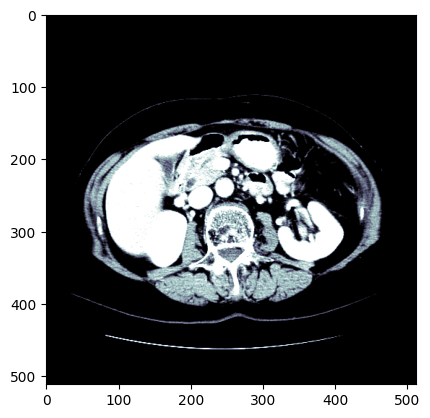

In [7]:
# Preprocess the nii file 
# Source https://docs.fast.ai/medical.imaging

dicom_windows = types.SimpleNamespace(
    brain=(80,40),
    subdural=(254,100),
    stroke=(8,32),
    brain_bone=(2800,600),
    brain_soft=(375,40),
    lungs=(1500,-600),
    mediastinum=(350,50),
    abdomen_soft=(400,50),
    liver=(150,30),
    spine_soft=(250,50),
    spine_bone=(1800,400),
    custom = (200,60)
)

@patch
def windowed(self:Tensor, w, l):
    px = self.clone()
    px_min = l - w//2
    px_max = l + w//2
    px[px<px_min] = px_min
    px[px>px_max] = px_max
    return (px-px_min) / (px_max-px_min)

plt.imshow(tensor(sample_ct[...,50].astype(np.float32)).windowed(*dicom_windows.liver), cmap=plt.cm.bone);

In [8]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(18,15))

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')
    
    plt.subplot(1,4,2)
    plt.imshow(tensor(array_list[0].astype(np.float32)).windowed(*dicom_windows.liver), cmap='bone');
    plt.title('Windowed Image')
    
    plt.subplot(1,4,3)
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Mask')
    
    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Liver & Mask')


    plt.show()

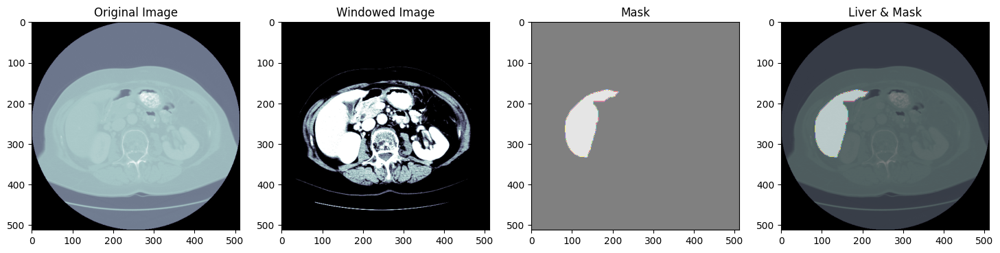

In [9]:
sample=50
sample_slice = tensor(sample_ct[...,sample].astype(np.float32))

plot_sample([sample_ct[...,sample], sample_mask[...,sample]])

In [10]:
# Check the mask values
mask = Image.fromarray(sample_mask[...,sample].astype('uint8'), mode="L")
unique, counts = np.unique(mask, return_counts=True)
print( np.array((unique, counts)).T)

[[     0 252049]
 [     1  10095]]


<Axes: >

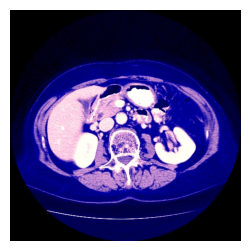

In [11]:
# Preprocessing functions
# Source https://docs.fast.ai/medical.imaging

class TensorCTScan(TensorImageBW): _show_args = {'cmap':'bone'}

@patch
def freqhist_bins(self:Tensor, n_bins=100):
    ''''"A function to split the range of pixel values into groups, 
    such that each group has around the same number of pixels"'''
    imsd = self.view(-1).sort()[0]
    t = torch.cat([tensor([0.001]),
                   torch.arange(n_bins).float()/n_bins+(1/2/n_bins),
                   tensor([0.999])])
    t = (len(imsd)*t).long()
    return imsd[t].unique()
    
@patch
def hist_scaled(self:Tensor, brks=None):
    "Scales a tensor using `freqhist_bins` to values between 0 and 1"
    if self.device.type=='cuda': return self.hist_scaled_pt(brks)
    if brks is None: brks = self.freqhist_bins()
    ys = np.linspace(0., 1., len(brks))
    x = self.numpy().flatten()
    x = np.interp(x, brks.numpy(), ys)
    return tensor(x).reshape(self.shape).clamp(0.,1.)
    
    
@patch
def to_nchan(x:Tensor, wins, bins=None):
    res = [x.windowed(*win) for win in wins]
    if not isinstance(bins,int) or bins!=0: res.append(x.hist_scaled(bins).clamp(0,1))
    dim = [0,1][x.dim()==3]
    return TensorCTScan(torch.stack(res, dim=dim))

@patch
def save_jpg(x:(Tensor), path, wins, bins=None, quality=90):
    fn = Path(path).with_suffix('.jpg')
    x = (x.to_nchan(wins, bins)*255).byte()
    im = Image.fromarray(x.permute(1,2,0).numpy(), mode=['RGB','CMYK'][x.shape[0]==4])
    im.save(fn, quality=quality)

_,axs=subplots(1,1)

sample_slice.save_jpg('test.jpg', [dicom_windows.liver,dicom_windows.custom])
show_image(Image.open('test.jpg'), ax=axs[0])

In [12]:
df_files_1=df_files[0:30]
df_files_1

,dirname,filename,mask_dirname,mask_filename
0,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-0.nii,../input/liver-tumor-segmentation/segmentations,segmentation-0.nii
1,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-1.nii,../input/liver-tumor-segmentation/segmentations,segmentation-1.nii
2,/kaggle/input/liver-tumor-segmentation/volume_pt1,volume-10.nii,../input/liver-tumor-segmentation/segmentations,segmentation-10.nii
3,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt6,volume-100.nii,../input/liver-tumor-segmentation/segmentations,segmentation-100.nii
4,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-101.nii,../input/liver-tumor-segmentation/segmentations,segmentation-101.nii
5,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-102.nii,../input/liver-tumor-segmentation/segmentations,segmentation-102.nii
6,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-103.nii,../input/liver-tumor-segmentation/segmentations,segmentation-103.nii
7,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-104.nii,../input/liver-tumor-segmentation/segmentations,segmentation-104.nii
8,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-105.nii,../input/liver-tumor-segmentation/segmentations,segmentation-105.nii
9,/kaggle/input/liver-tumor-segmentation-part-2/volume_pt8,volume-106.nii,../input/liver-tumor-segmentation/segmentations,segmentation-106.nii


In [13]:
#!pip install --upgrade jupyter ipywidgets


In [14]:
#!jupyter nbextension enable --py widgetsnbextension


In [15]:
#!pip install --upgrade pip


In [16]:
import random

GENERATE_JPG_FILES = True   # warning: generation takes ~ 1h

if GENERATE_JPG_FILES:
    path = Path(".")

    os.makedirs('train_images', exist_ok=True)
    os.makedirs('train_masks', exist_ok=True)

    # Randomly select 1/3 of the indices
    random_indices = random.sample(range(len(df_files)), len(df_files) // 2)

    for ii in tqdm(range(len(df_files))):  # take 1/3 nii files for training
        curr_ct = read_nii(df_files.loc[ii, 'dirname'] + "/" + df_files.loc[ii, 'filename'])
        curr_mask = read_nii(df_files.loc[ii, 'mask_dirname'] + "/" + df_files.loc[ii, 'mask_filename'])
        curr_file_name = str(df_files.loc[ii, 'filename']).split('.')[0]
        curr_dim = curr_ct.shape[2]  # 512, 512, curr_dim

        for curr_slice in range(0, curr_dim, 2):  # export every 2nd slice for training
            data = tensor(curr_ct[..., curr_slice].astype(np.float32))
            mask = Image.fromarray(curr_mask[..., curr_slice].astype('uint8'), mode="L")
            data.save_jpg(f"train_images/{curr_file_name}_slice_{curr_slice}.jpg", [dicom_windows.liver, dicom_windows.custom])
            mask.save(f"train_masks/{curr_file_name}_slice_{curr_slice}_mask.png")
else:
    path = Path("../input/liver-segmentation-with-fastai-v2")  # read jpg from saved kernel output


  0%|          | 0/131 [00:00<?, ?it/s]

pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1
pixdim[0] (qfac) should be 1 (default) or -1; setting qfac to 1


In [17]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from PIL import Image
from sklearn.model_selection import train_test_split

# Set the directories
images_dir = 'train_images'
masks_dir = 'train_masks'

# Get the list of image file names
all_image_file_names = sorted(os.listdir(images_dir))

# Randomly select 9000 images
selected_image_file_names = random.sample(all_image_file_names, 9000)

# Load selected images and masks with resizing
target_size = (128, 128)
images = [np.array(Image.open(os.path.join(images_dir, fname)).resize(target_size)) for fname in selected_image_file_names]

# Adjust file extension for masks
mask_file_names = [fname.replace('.jpg', '_mask.png') for fname in selected_image_file_names]
masks = [np.array(Image.open(os.path.join(masks_dir, fname)).resize(target_size)) for fname in mask_file_names]

# Convert the lists to numpy arrays
images = np.array(images)
masks = np.array(masks)

# Normalize images to [0, 1]
images = images / 255.0

# Reshape masks to include a channel dimension
masks = masks.reshape((masks.shape[0], masks.shape[1], masks.shape[2], 1))


In [18]:
# Split the data into training, validation, and test sets
# 70% training, 20% validation, 10% test
x_train, x_temp, y_train, y_temp = train_test_split(images, masks, test_size=0.3, random_state=42)
x_valid, x_test, y_valid, y_test = train_test_split(x_temp, y_temp, test_size=1/3, random_state=42)

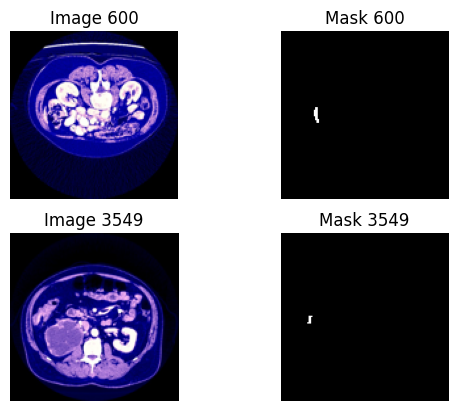

In [19]:
import matplotlib.pyplot as plt

# Function to display images and masks
def display_images_and_masks(images, masks, num_samples=2):
    # Randomly select samples
    sample_indices = random.sample(range(images.shape[0]), num_samples)

    for i in range(num_samples):
        index = sample_indices[i]

        # Display the image
        plt.subplot(num_samples, 2, 2 * i + 1)
        plt.imshow(images[index])
        plt.title("Image {}".format(index))
        plt.axis("off")

        # Display the mask
        plt.subplot(num_samples, 2, 2 * i + 2)
        plt.imshow(masks[index].squeeze(), cmap='gray')
        plt.title("Mask {}".format(index))
        plt.axis("off")

    plt.show()

# Display two random images and masks
display_images_and_masks(x_train, y_train)

In [20]:
y_train.shape, x_train.shape

((6300, 128, 128, 1), (6300, 128, 128, 3))

In [21]:
from tensorflow import keras
from tensorflow.keras import layers

def create_fcn_model(input_shape=(128, 128, 3), target_shape=(128, 128, 1)):
    model = keras.Sequential()

    # Encoder
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    # Decoder with Skip Connections
    model.add(layers.UpSampling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())

    model.add(layers.UpSampling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())

    model.add(layers.UpSampling2D((2, 2)))
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())

    # Output layer
    model.add(layers.Conv2D(1, (1, 1), activation='sigmoid'))  # Assuming binary classification

    # Crop to match the target shape
    crop_height = (model.output_shape[1] - target_shape[0]) // 2
    crop_width = (model.output_shape[2] - target_shape[1]) // 2
    model.add(layers.Cropping2D(cropping=((crop_height, crop_height), (crop_width, crop_width))))

    return model
# Create the FCN model
model = create_fcn_model()

# Display the model summary
model.summary()
model.save('fcn_model.h5')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 batch_normalization (Batch  (None, 128, 128, 64)      256       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 batch_normalization_1 (Bat  (None, 128, 128, 64)      256       
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 64)        0         
 D)                                                              
                                                        

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [22]:
import tensorflow as tf

def dice_coefficient(y_true, y_pred):
    smooth = 1.0  # Smoothing factor to avoid division by zero
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice


In [23]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

checkpoint = tf.keras.callbacks.ModelCheckpoint("fcn_model.h5", monitor='val_loss', verbose=1, patience = 3,save_best_only=True,
                                                save_weights_only=True, mode='auto')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs', histogram_freq=1)

In [24]:
from tensorflow.keras.optimizers import Adam
# Compile the model [0.001,0001, 6e-e]
model.compile(optimizer=Adam(lr=.001),loss='binary_crossentropy',
              metrics=[dice_coefficient])

In [25]:
# Train the model
history = model.fit(x_train, y_train, epochs=10, batch_size=16,
          validation_data=(x_valid, y_valid), callbacks=[reduce_lr,checkpoint])
model.save('fcn_model.h5')

Epoch 1/10
394/394 [==============================] - ETA: 0s - loss: 0.2290 - dice_coefficient: 0.2237
Epoch 1: val_loss improved from inf to 0.07329, saving model to fcn_model.h5
394/394 [==============================] - 32s 54ms/step - loss: 0.2290 - dice_coefficient: 0.2237 - val_loss: 0.0733 - val_dice_coefficient: 0.2041 - lr: 0.0010
Epoch 2/10
394/394 [==============================] - ETA: 0s - loss: 0.0547 - dice_coefficient: 0.4812
Epoch 2: val_loss did not improve from 0.07329
394/394 [==============================] - 18s 47ms/step - loss: 0.0547 - dice_coefficient: 0.4812 - val_loss: 0.1340 - val_dice_coefficient: 0.3271 - lr: 0.0010
Epoch 3/10
393/394 [============================>.] - ETA: 0s - loss: 0.0323 - dice_coefficient: 0.6102
Epoch 3: val_loss improved from 0.07329 to 0.04135, saving model to fcn_model.h5
394/394 [==============================] - 18s 47ms/step - loss: 0.0324 - dice_coefficient: 0.6095 - val_loss: 0.0414 - val_dice_coefficient: 0.6226 - lr: 0.00

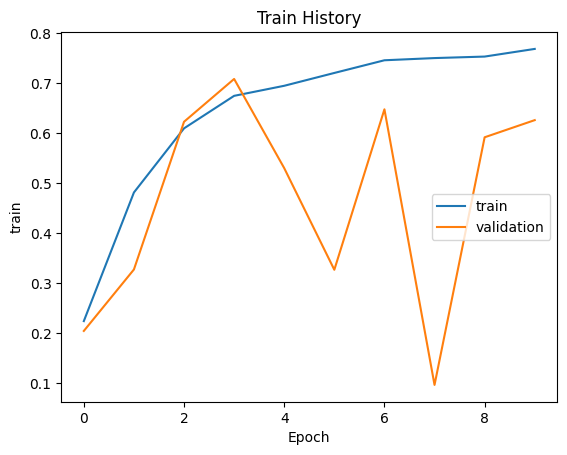

In [26]:
import matplotlib.pyplot as plt
def show_history(history, train, validation):
    plt.plot(history.history[train])
    plt.plot(history.history[validation])
    plt.title('Train History')
    plt.ylabel('train')
    plt.xlabel('Epoch')
    plt.legend(['train', 'validation'], loc='center right')
    plt.show()
show_history(history, 'dice_coefficient', 'val_dice_coefficient')

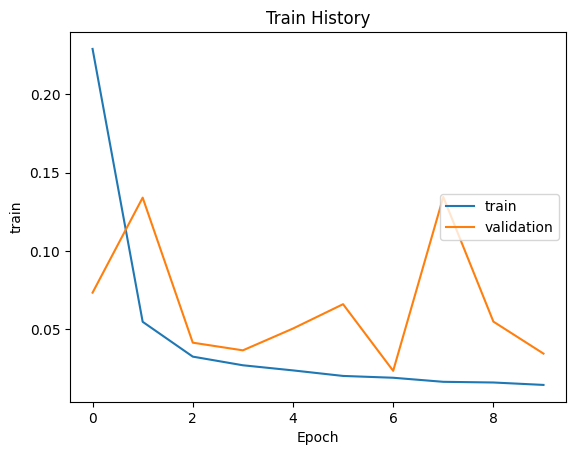

In [27]:
show_history(history, 'loss', 'val_loss')

In [28]:
scores = model.evaluate(x_valid, y_valid)
scores[1]

57/57 [==============================] - 2s 25ms/step - loss: 1.0691 - dice_coefficient: 0.1959


0.19587302207946777

In [29]:
prediction = model.predict(x_test)
#print(prediction)
#print(y_test)

29/29 [==============================] - 1s 33ms/step


In [30]:
test_scores = model.evaluate(x_test, y_test)
test_scores[1]

29/29 [==============================] - 1s 25ms/step - loss: 1.0732 - dice_coefficient: 0.1971


0.19712267816066742

1/1 [==============================] - 0s 170ms/step


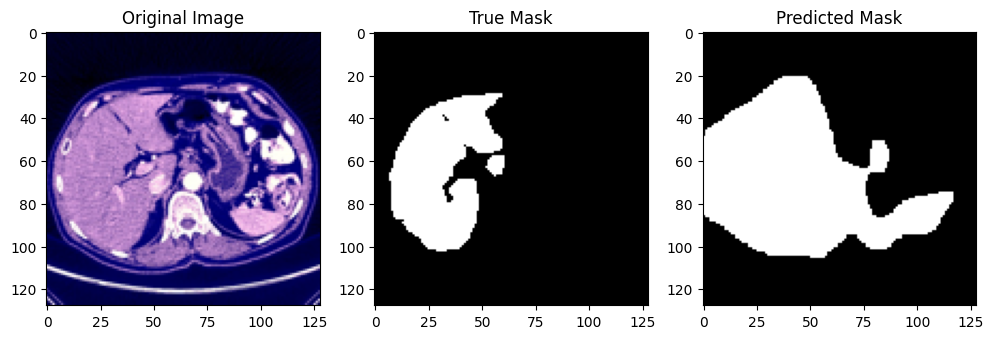

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have x_test and y_test
# Replace this with the actual index of the image you want to visualize
image_index = 44

# Load the image and true mask
input_image = x_test[image_index]
true_mask = y_test[image_index]

# Obtain the predicted mask from model2
predicted_mask = model.predict(np.expand_dims(input_image, axis=0))[0]

# Threshold the predicted mask (assuming it's a binary mask)
threshold = 0.5  # Adjust this threshold based on your model's output
predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

# Plotting
plt.figure(figsize=(12, 4))

# Plot original image
plt.subplot(1, 3, 1)
plt.imshow(input_image)
plt.title('Original Image')

# Plot true mask
plt.subplot(1, 3, 2)
plt.imshow(true_mask[:, :, 0], cmap='gray')
plt.title('True Mask')

# Plot predicted mask
plt.subplot(1, 3, 3)
plt.imshow(predicted_mask_binary[:, :, 0], cmap='gray')
plt.title('Predicted Mask')

plt.show()


In [32]:
import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate

# Define Dice coefficient as a metric
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1)
    return (2. * intersection + smooth) / (union + smooth)

# U-Net model architecture for liver segmentation
def unet_model(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Middle
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)

    # Decoder
    up4 = UpSampling2D(size=(2, 2))(conv3)
    up4 = Conv2D(64, (3, 3), activation='relu', padding='same')(up4)
    up4 = Conv2D(64, (3, 3), activation='relu', padding='same')(up4)
    merge4 = concatenate([conv2, up4], axis=3)

    up5 = UpSampling2D(size=(2, 2))(merge4)
    up5 = Conv2D(32, (3, 3), activation='relu', padding='same')(up5)
    up5 = Conv2D(32, (3, 3), activation='relu', padding='same')(up5)
    merge5 = concatenate([conv1, up5], axis=3)

    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(merge5)

    model1 = Model(inputs=inputs, outputs=outputs)

    return model1

# Build the U-Net model
model1 = unet_model()

# Display the model summary
model1.summary()
model1.save('unet_model.h5')

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d_10 (Conv2D)          (None, 128, 128, 32)         896       ['input_1[0][0]']             
                                                                                                  
 conv2d_11 (Conv2D)          (None, 128, 128, 32)         9248      ['conv2d_10[0][0]']           
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 32)           0         ['conv2d_11[0][0]']           
 g2D)                                                                                         

In [33]:
from tensorflow.keras.utils import plot_model
#tf.keras.utils.plot_model(model1, show_shapes=True)
# Assuming you have created the model using the create_fcn_model function
#model1 = create_unet_model()

# Save the model architecture plot to a file
#plot_model(model1, to_file='unet_model.png', show_shapes=False)

In [34]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("unet_model.h5", monitor='val_loss', verbose=1, patience = 3,save_best_only=True,
                                                mode='auto')

import tensorflow as tf

# Define callbacks
checkpoint = tf.keras.callbacks.ModelCheckpoint("unet_model.h5", 
                                                monitor='val_loss', 
                                                verbose=1, 
                                                patience=3,
                                                save_best_only=True,
                                                mode='auto')

# Define other similar callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                  patience=5,
                                                  mode='auto',
                                                  restore_best_weights=True)








In [35]:
from tensorflow.keras.optimizers import Adam
# Compile the model [0.001,0001, 6e-e]
model1.compile(optimizer='rmsprop',
              loss= 'mean_absolute_error', metrics=[dice_coefficient])

In [36]:
# Train the model
history1 = model1.fit(x_train, y_train, epochs=15, batch_size=16,
          validation_data=(x_valid, y_valid), callbacks=[checkpoint])
model1.save('unet_model.h5')

Epoch 1/15
394/394 [==============================] - ETA: 0s - loss: 0.0263 - dice_coefficient: 0.9868
Epoch 1: val_loss improved from inf to 0.02337, saving model to unet_model.h5
394/394 [==============================] - 20s 40ms/step - loss: 0.0263 - dice_coefficient: 0.9868 - val_loss: 0.0234 - val_dice_coefficient: 0.9888
Epoch 2/15
393/394 [============================>.] - ETA: 0s - loss: 0.0243 - dice_coefficient: 0.9882
Epoch 2: val_loss improved from 0.02337 to 0.02337, saving model to unet_model.h5
394/394 [==============================] - 14s 34ms/step - loss: 0.0243 - dice_coefficient: 0.9883 - val_loss: 0.0234 - val_dice_coefficient: 0.9888
Epoch 3/15
393/394 [============================>.] - ETA: 0s - loss: 0.0243 - dice_coefficient: 0.9882
Epoch 3: val_loss improved from 0.02337 to 0.02337, saving model to unet_model.h5
394/394 [==============================] - 14s 35ms/step - loss: 0.0243 - dice_coefficient: 0.9883 - val_loss: 0.0234 - val_dice_coefficient: 0.9888

In [37]:
scores1 = model1.evaluate(x_valid, y_valid)
scores1[1]

57/57 [==============================] - 2s 19ms/step - loss: 0.0234 - dice_coefficient: 0.9888


0.9887827634811401

In [38]:
prediction1 = model1.predict(x_test)
#print(prediction)
#print(y_test)

29/29 [==============================] - 1s 24ms/step


In [39]:
test_scores1 = model1.evaluate(x_test, y_test)
test_scores1[1]

29/29 [==============================] - 1s 19ms/step - loss: 0.0237 - dice_coefficient: 0.9885


0.9885087609291077

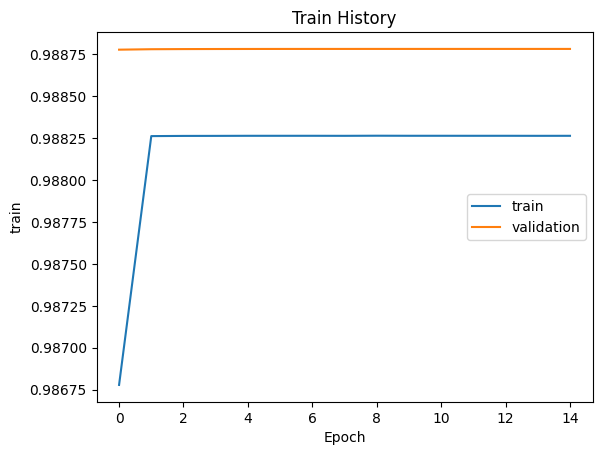

In [40]:
import matplotlib.pyplot as plt
def show_history(history, train, validation,x=1):
    plt.plot(history.history[train])
    plt.plot(history.history[validation])
    plt.title('Train History')
    plt.ylabel('train')
    plt.xlabel('Epoch')
    plt.legend(['train', 'validation'], loc='center right')
    
            
        
    plt.savefig(f'{train}dice_coefficient_{str(x)}.png')
    plt.show()
show_history(history1, 'dice_coefficient', 'val_dice_coefficient')


1/1 [==============================] - 0s 129ms/step


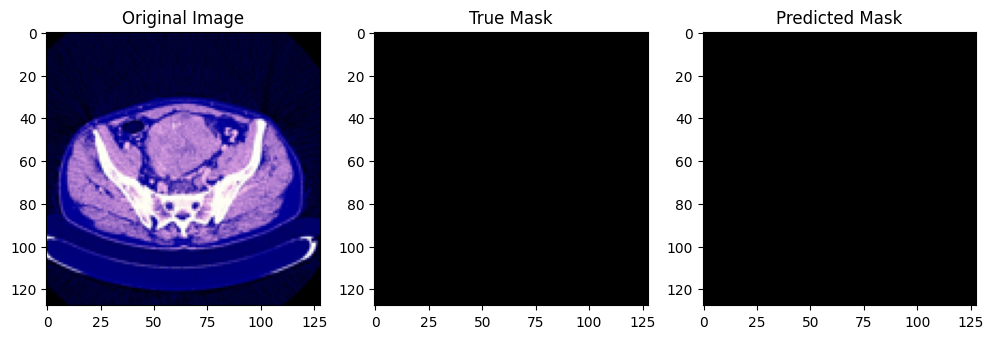

1/1 [==============================] - 0s 19ms/step


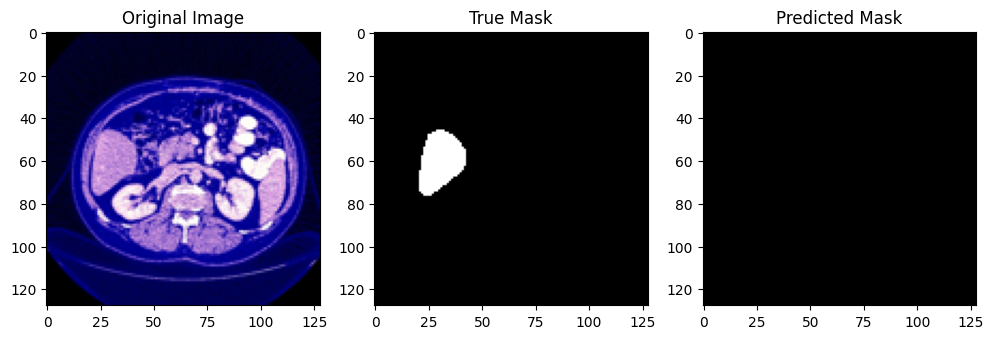

1/1 [==============================] - 0s 20ms/step


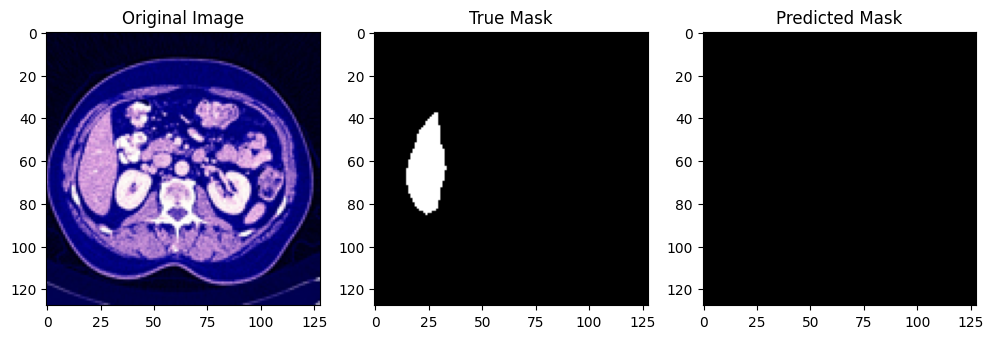

1/1 [==============================] - 0s 22ms/step


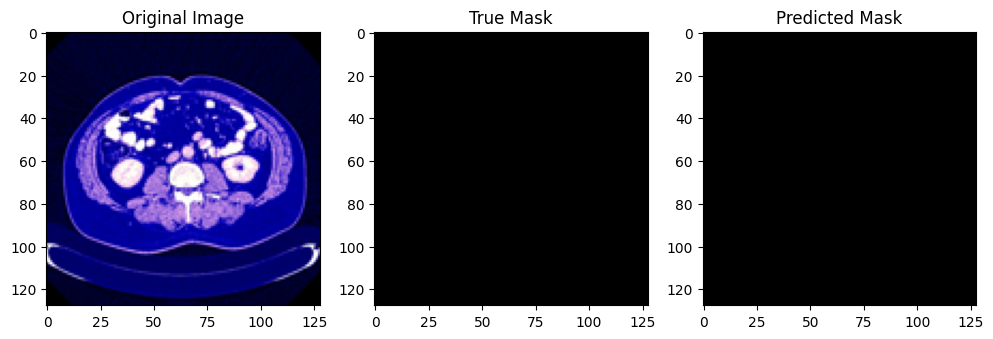

1/1 [==============================] - 0s 19ms/step


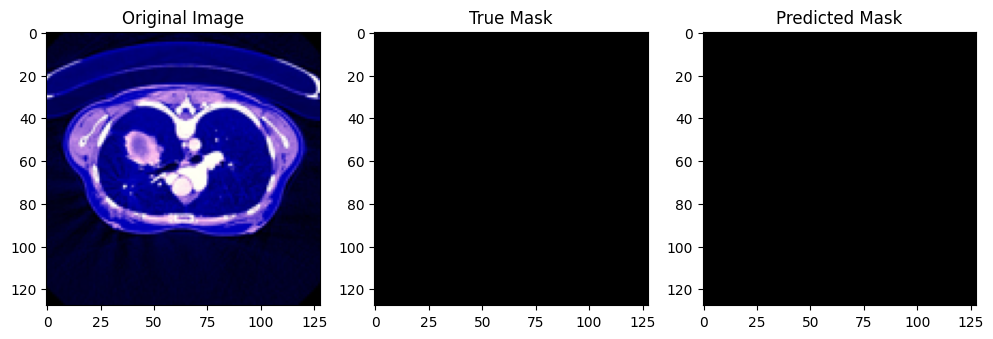

1/1 [==============================] - 0s 21ms/step


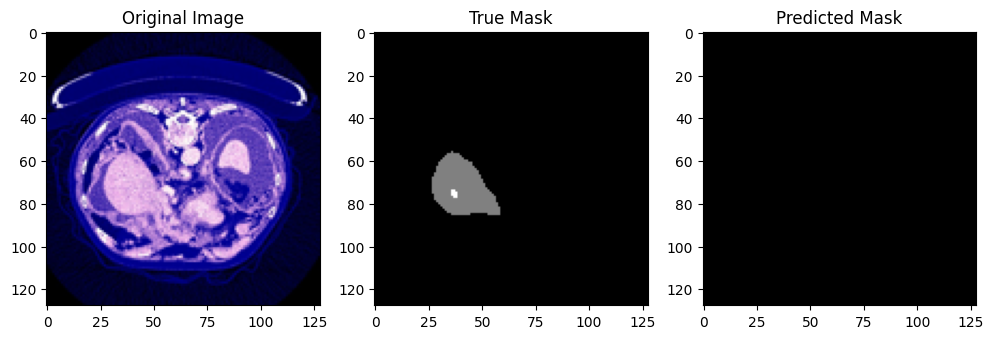

1/1 [==============================] - 0s 20ms/step


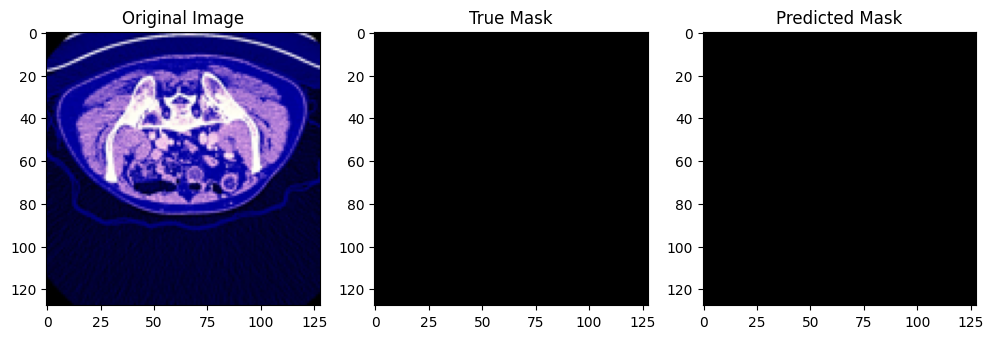

1/1 [==============================] - 0s 20ms/step


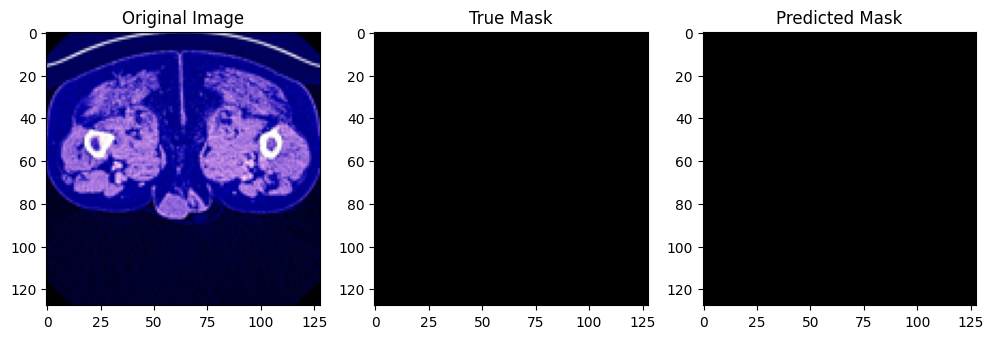

1/1 [==============================] - 0s 20ms/step


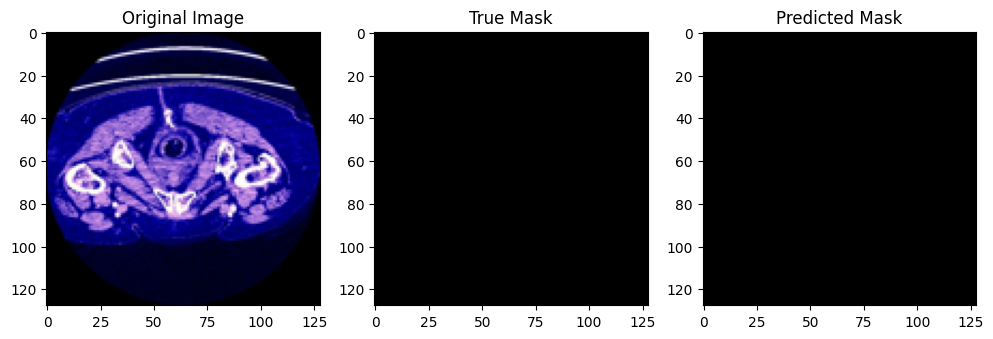

1/1 [==============================] - 0s 19ms/step


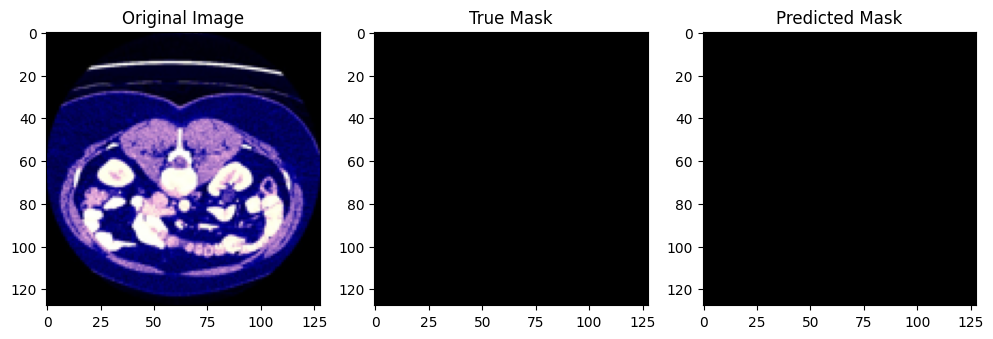

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import random

# Generate 10 random values between 1 and 100
random_values = [random.randint(1, 900) for _ in range(10)]

# Assuming you have x_test and y_test
# Replace this with the actual index of the image you want to visualize
for i in random_values:
    image_index = i

    # Load the image and true mask
    input_image = x_test[image_index]
    true_mask = y_test[image_index]

    # Obtain the predicted mask from model2
    predicted_mask = model1.predict(np.expand_dims(input_image, axis=0))[0]

    # Threshold the predicted mask (assuming it's a binary mask)
    threshold = 0.5  # Adjust this threshold based on your model's output
    predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

    # Plotting
    plt.figure(figsize=(12, 4))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.imshow(input_image)
    plt.title('Original Image')

    # Plot true mask
    plt.subplot(1, 3, 2)
    plt.imshow(true_mask[:, :, 0], cmap='gray')
    plt.title('True Mask')

    # Plot predicted mask
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask_binary[:, :, 0], cmap='gray')
    plt.title('Predicted Mask')

    plt.show()


In [42]:
def segnet_model(input_shape=(128, 128, 3)):
    model2 = tf.keras.Sequential()

    # Encoder
    model2.add(layers.Conv2D(64, (3, 3), padding='same', input_shape=input_shape))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Decoder
    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    # Output layer
    model2.add(layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same'))

    return model2

# Create SegNet model
model2 = segnet_model(input_shape=(128, 128, 3))


# Display the model summary
model2.summary()
model2.save('segnet_model2.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 batch_normalization_9 (Bat  (None, 128, 128, 64)      256       
 chNormalization)                                                
                                                                 
 activation (Activation)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_22 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 batch_normalization_10 (Ba  (None, 128, 128, 64)      256       
 tchNormalization)                                               
                                                                 
 activation_1 (Activation)   (None, 128, 128, 64)     

In [43]:
from tensorflow.keras.utils import plot_model
#tf.keras.utils.plot_model(model1, show_shapes=True)
# Assuming you have created the model using the create_fcn_model function
#model1 = create_unet_model()

# Save the model architecture plot to a file
#plot_model(model2, to_file='segnet_model.png', show_shapes=False)

In [44]:
def precision_score(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1)
    return (2. * intersection + smooth) / (union + smooth)

def precision_score_(groundtruth_mask, pred_mask):
    true_positive = np.sum(pred_mask * groundtruth_mask)
    false_positive = np.sum(pred_mask * (1 - groundtruth_mask))
    precision = true_positive / (true_positive + false_positive + 1e-9)  # Adding epsilon to avoid division by zero
    return round(precision, 3)

def recall_score_(groundtruth_mask, pred_mask):
    true_positive = np.sum(pred_mask * groundtruth_mask)
    false_negative = np.sum((1 - pred_mask) * groundtruth_mask)
    recall = true_positive / (true_positive + false_negative + 1e-9)  # Adding epsilon to avoid division by zero
    return round(recall, 3)
def accuracy(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    xor = np.sum(groundtruth_mask==pred_mask)
    acc = np.mean(xor/(union + xor - intersect))
    return round(acc, 3)
def iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    iou = np.mean(intersect/union)
    return round(iou, 3)


In [45]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("segnet_model2.h5", monitor='val_loss', verbose=1, patience = 3,save_best_only=True,
                                                mode='auto')
checkpoint = tf.keras.callbacks.ModelCheckpoint("segnet_model2.h5", 
                                                monitor='val_loss', 
                                                verbose=1, 
                                                patience=3,
                                                save_best_only=True,
                                                mode='auto')

# Define other similar callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                  patience=5,
                                                  mode='auto',
                                                  restore_best_weights=True)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=2,
                                                 min_lr=1e-6,
                                                 mode='auto',
                                                 verbose=1)

# Combine all callbacks into a list
callbacks = [checkpoint, early_stopping, reduce_lr]

In [46]:
from tensorflow.keras.optimizers import Adam
# Compile the model [0.001,0001, 6e-e]
model2.compile(optimizer=Adam(lr=0.001, beta_1=0.9, beta_2=0.999),
              loss= 'binary_crossentropy', metrics=[dice_coefficient])

In [47]:
model2.compile(optimizer='SGD',loss= 'binary_crossentropy', metrics=[dice_coefficient])

In [48]:
# Train the model
history2 = model2.fit(x_train, y_train, epochs=20, batch_size=32,
          validation_data=(x_valid, y_valid), callbacks=[checkpoint])
model2.save('segnet_model2.h5')

Epoch 1/20
197/197 [==============================] - ETA: 0s - loss: 0.1574 - dice_coefficient: 0.9001
Epoch 1: val_loss improved from inf to 0.14340, saving model to segnet_model2.h5
197/197 [==============================] - 46s 198ms/step - loss: 0.1574 - dice_coefficient: 0.9001 - val_loss: 0.1434 - val_dice_coefficient: 0.9127
Epoch 2/20
197/197 [==============================] - ETA: 0s - loss: 0.0475 - dice_coefficient: 0.9666
Epoch 2: val_loss improved from 0.14340 to 0.07781, saving model to segnet_model2.h5
197/197 [==============================] - 34s 174ms/step - loss: 0.0475 - dice_coefficient: 0.9666 - val_loss: 0.0778 - val_dice_coefficient: 0.9592
Epoch 3/20
197/197 [==============================] - ETA: 0s - loss: 0.0309 - dice_coefficient: 0.9772
Epoch 3: val_loss improved from 0.07781 to 0.03867, saving model to segnet_model2.h5
197/197 [==============================] - 34s 174ms/step - loss: 0.0309 - dice_coefficient: 0.9772 - val_loss: 0.0387 - val_dice_coeffic

In [49]:
scores2 = model2.evaluate(x_valid, y_valid)
scores2[1]

57/57 [==============================] - 3s 55ms/step - loss: -0.3458 - dice_coefficient: 0.9936


0.9935923218727112

In [50]:
prediction2 = model2.predict(x_test)
#print(prediction)
#print(y_test)


29/29 [==============================] - 2s 68ms/step


In [51]:
test_scores2 = model2.evaluate(x_test, y_test)
test_scores2[1]

29/29 [==============================] - 2s 54ms/step - loss: -0.2368 - dice_coefficient: 0.9933


0.9932585954666138

In [52]:
len(x_test)

900

In [53]:
import random


333
1/1 [==============================] - 0s 187ms/step


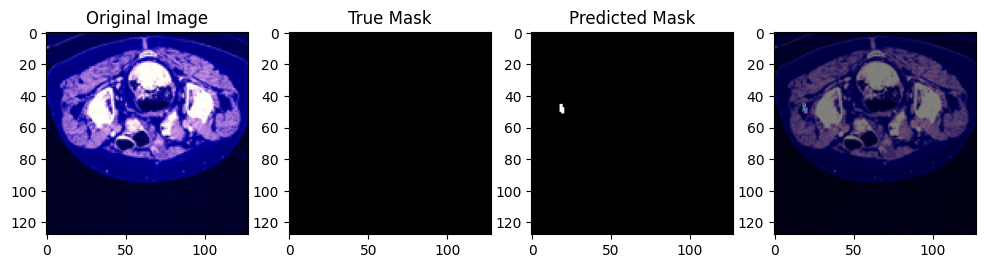

812
1/1 [==============================] - 0s 20ms/step


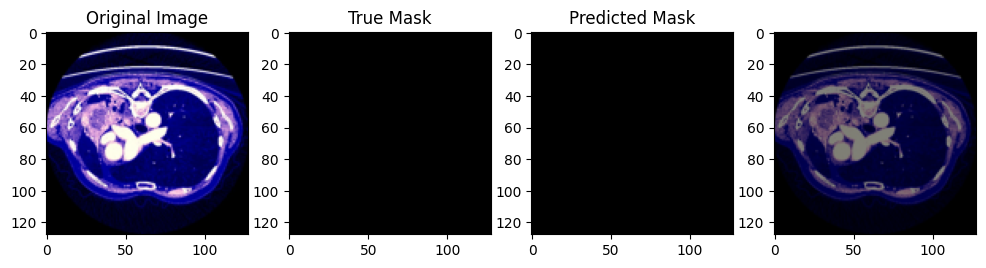

745
1/1 [==============================] - 0s 21ms/step


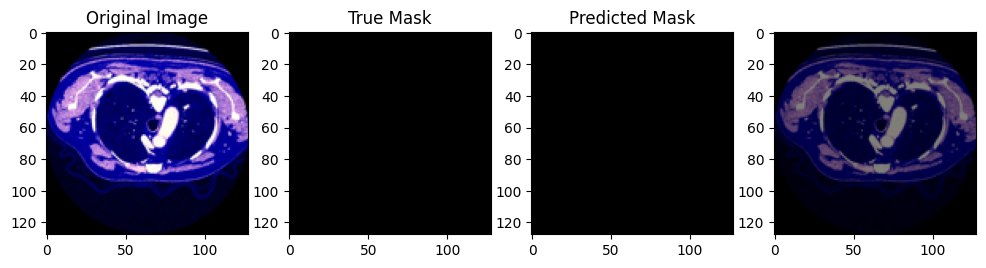

245
1/1 [==============================] - 0s 22ms/step


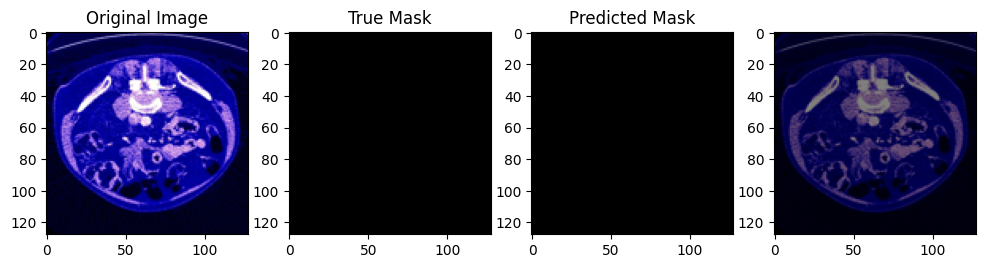

40
1/1 [==============================] - 0s 21ms/step


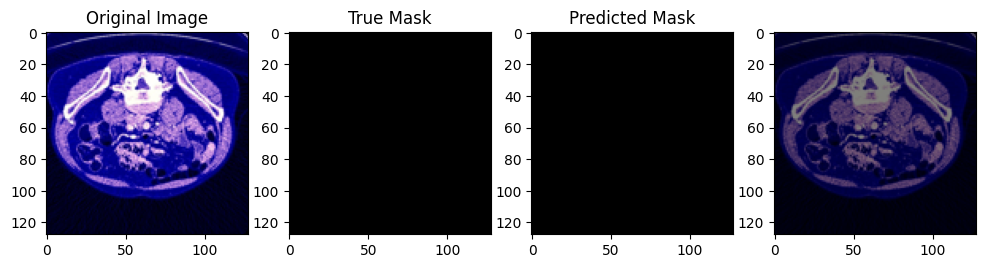

427
1/1 [==============================] - 0s 20ms/step


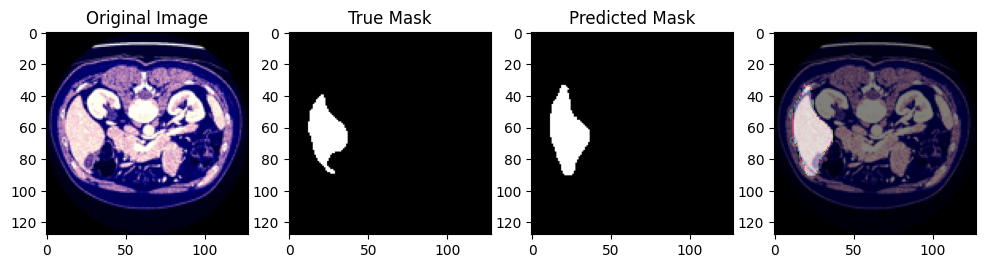

303
1/1 [==============================] - 0s 20ms/step


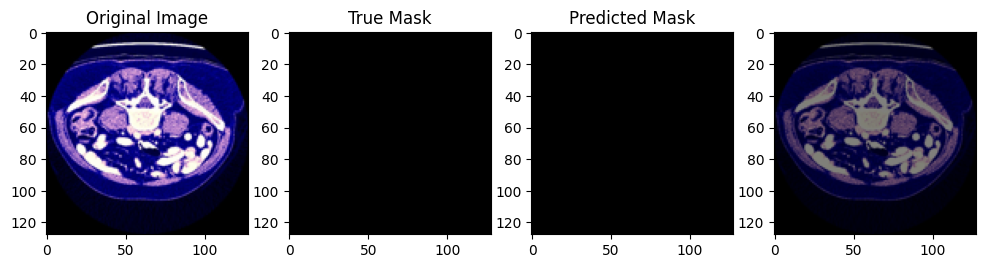

588
1/1 [==============================] - 0s 19ms/step


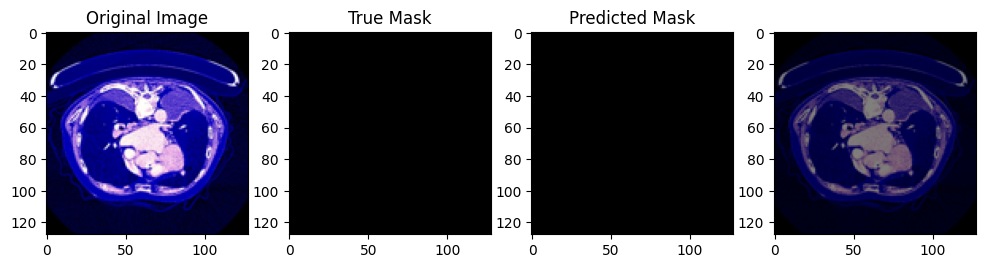

210
1/1 [==============================] - 0s 24ms/step


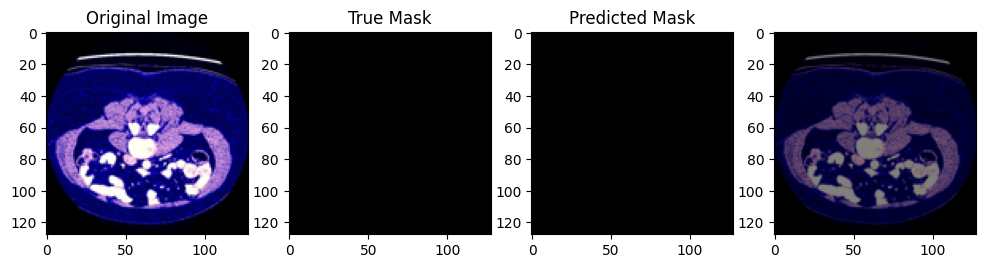

137
1/1 [==============================] - 0s 22ms/step


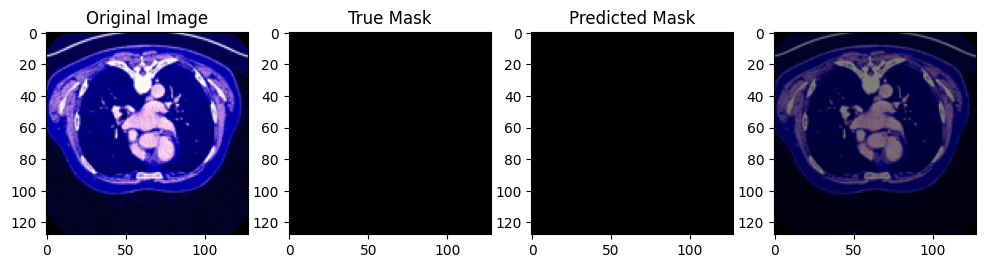

138
1/1 [==============================] - 0s 22ms/step


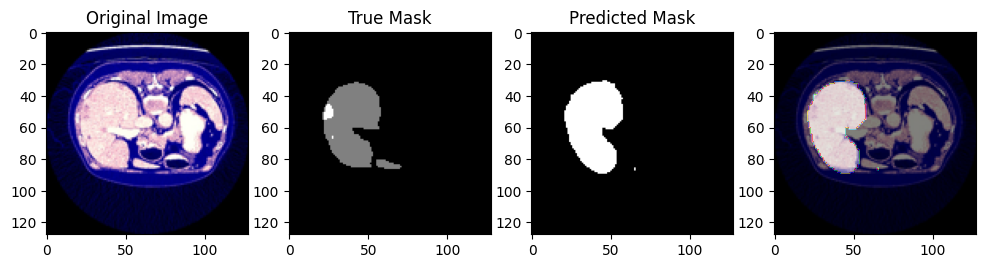

261
1/1 [==============================] - 0s 22ms/step


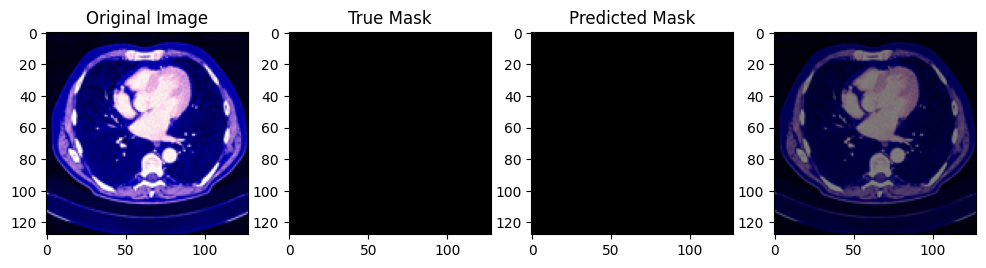

352
1/1 [==============================] - 0s 21ms/step


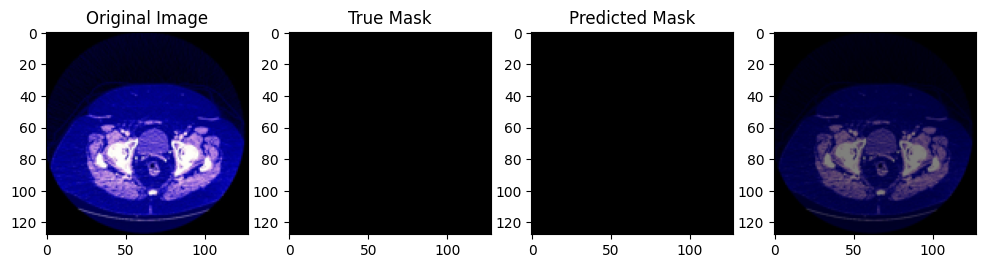

360
1/1 [==============================] - 0s 20ms/step


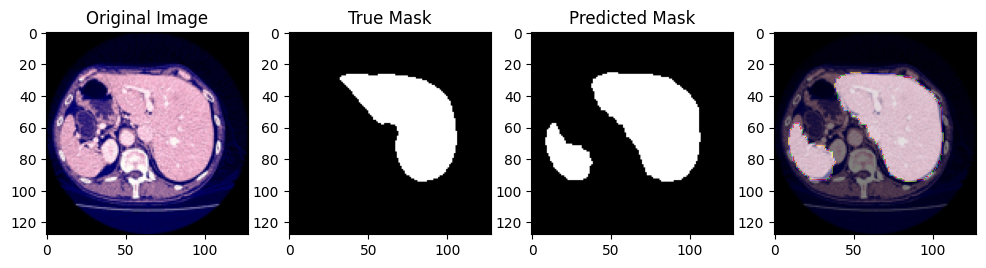

347
1/1 [==============================] - 0s 21ms/step


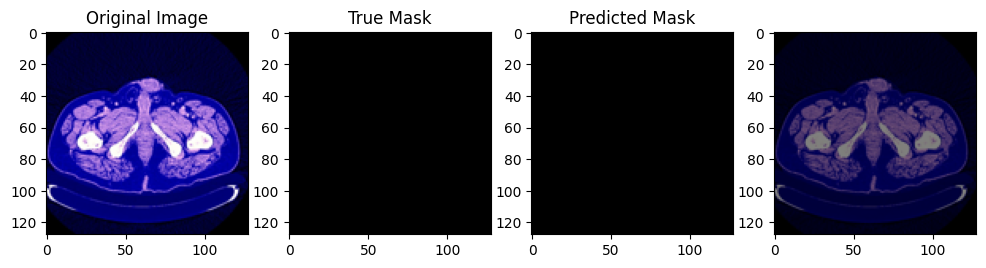

479
1/1 [==============================] - 0s 20ms/step


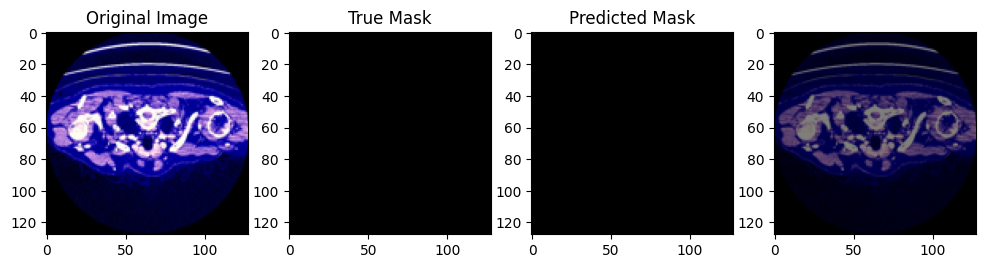

307
1/1 [==============================] - 0s 20ms/step


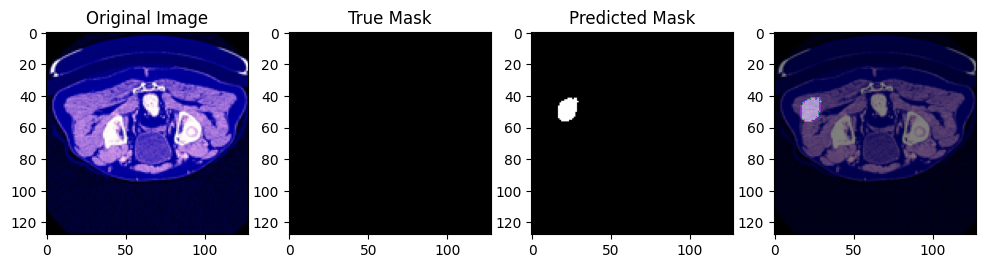

658
1/1 [==============================] - 0s 20ms/step


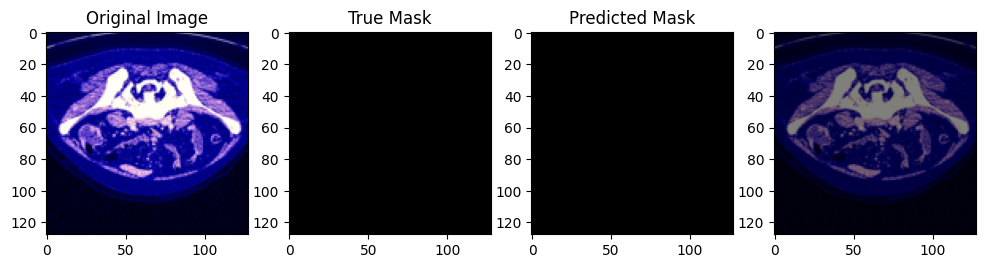

895
1/1 [==============================] - 0s 20ms/step


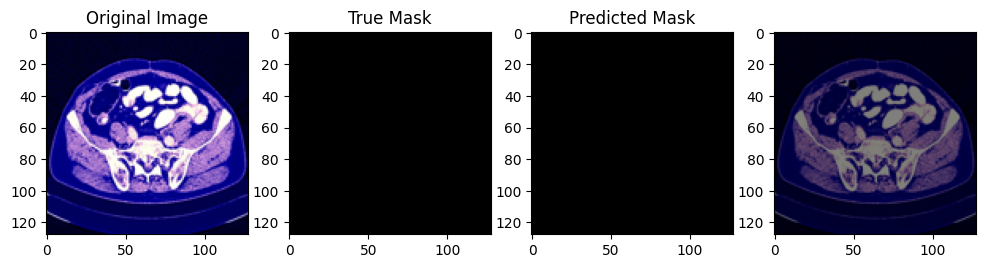

111
1/1 [==============================] - 0s 21ms/step


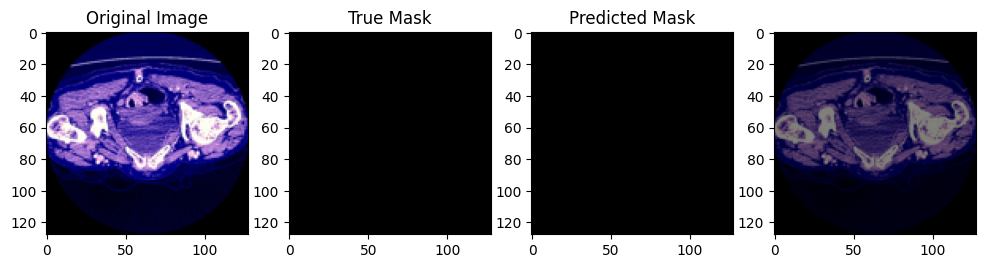

297
1/1 [==============================] - 0s 21ms/step


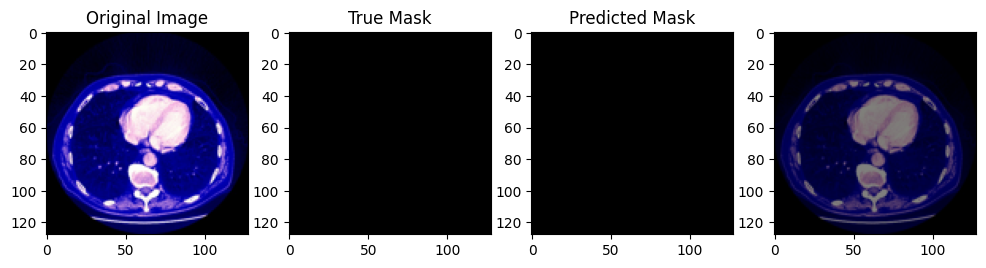

452
1/1 [==============================] - 0s 25ms/step


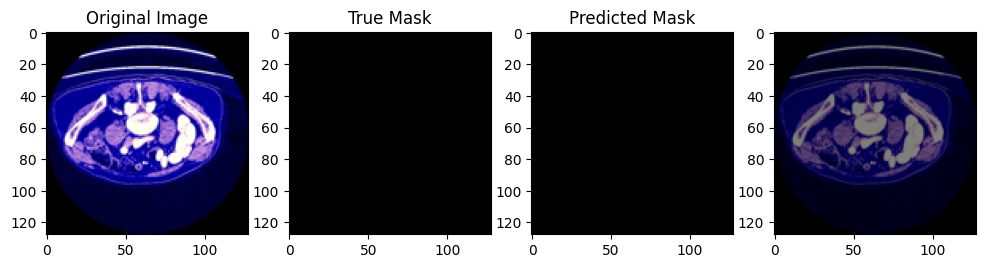

193
1/1 [==============================] - 0s 21ms/step


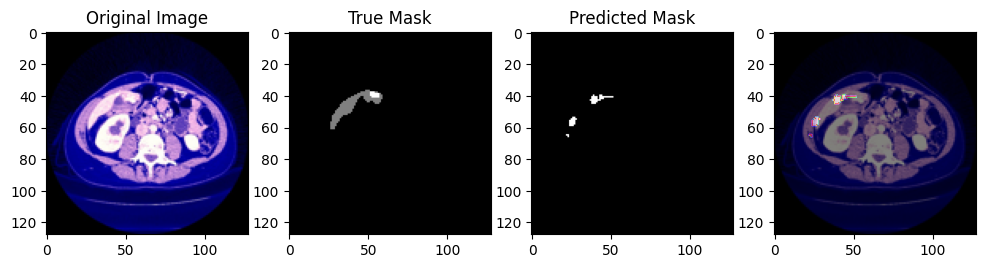

863
1/1 [==============================] - 0s 20ms/step


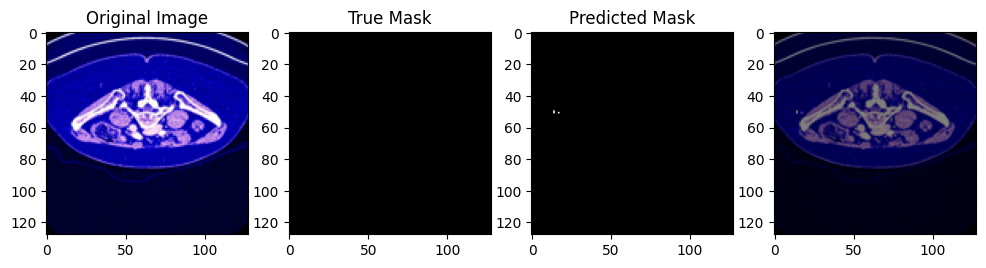

542
1/1 [==============================] - 0s 20ms/step


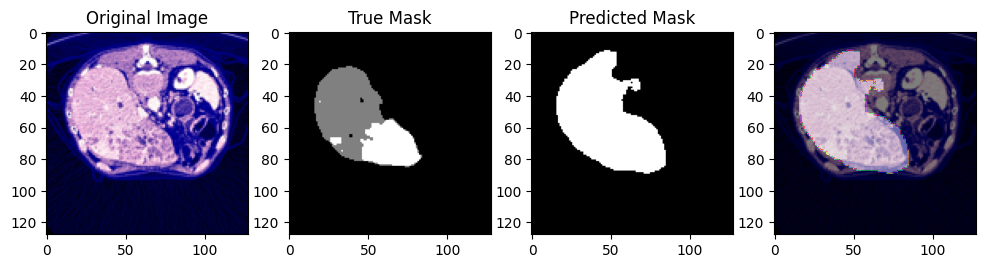

855
1/1 [==============================] - 0s 23ms/step


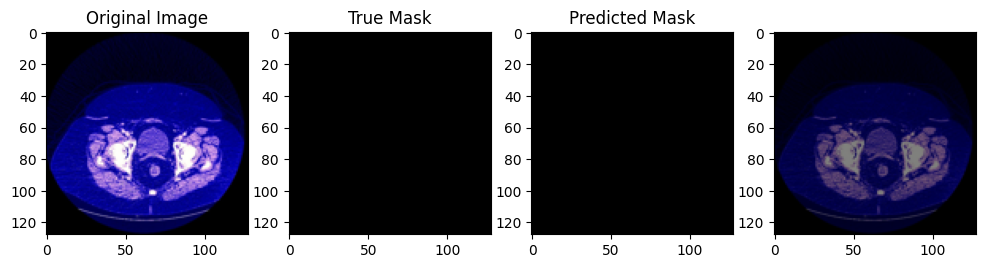

31
1/1 [==============================] - 0s 23ms/step


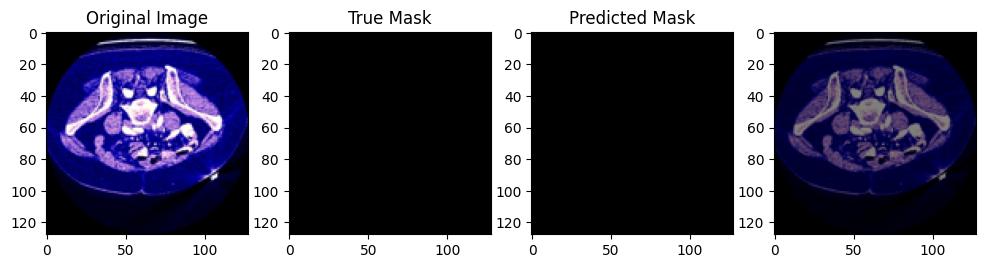

818
1/1 [==============================] - 0s 21ms/step


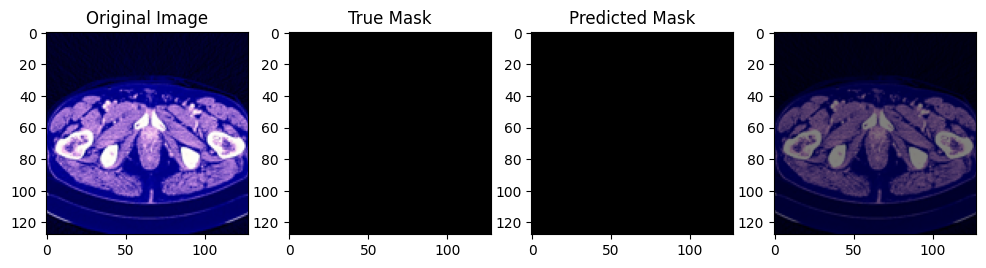

64
1/1 [==============================] - 0s 21ms/step


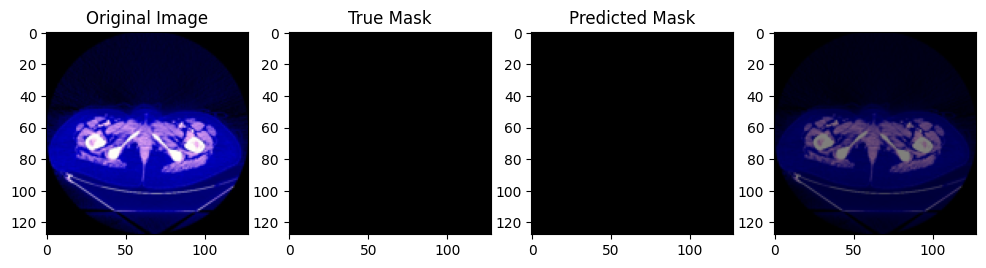

709
1/1 [==============================] - 0s 21ms/step


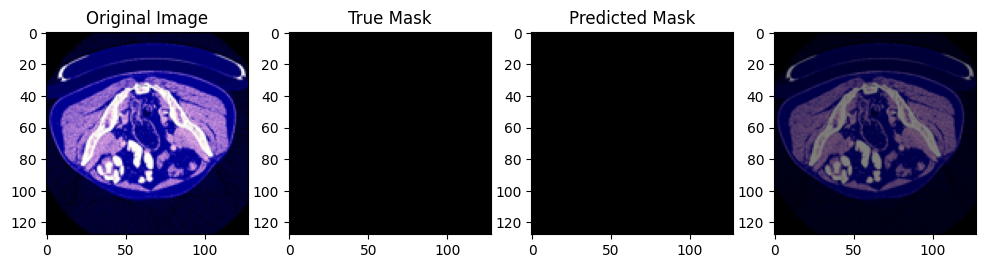

260
1/1 [==============================] - 0s 21ms/step


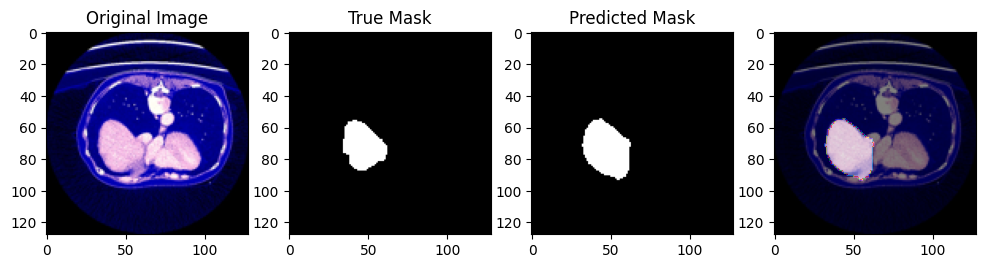

142
1/1 [==============================] - 0s 20ms/step


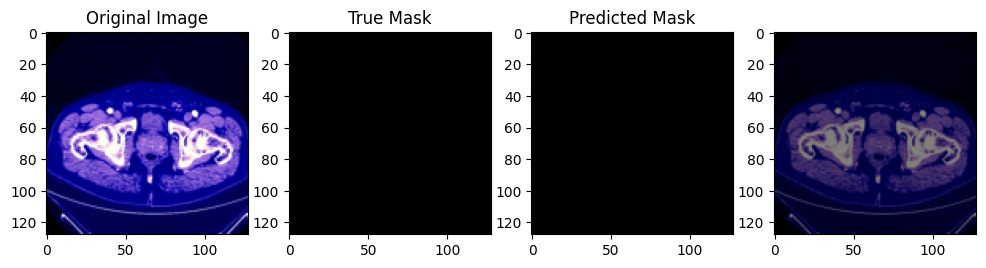

631
1/1 [==============================] - 0s 20ms/step


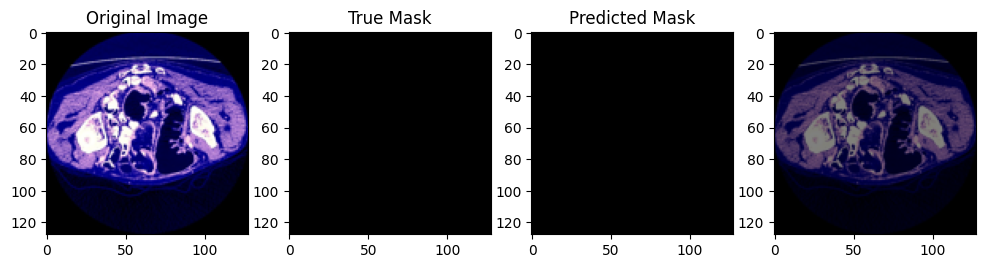

430
1/1 [==============================] - 0s 21ms/step


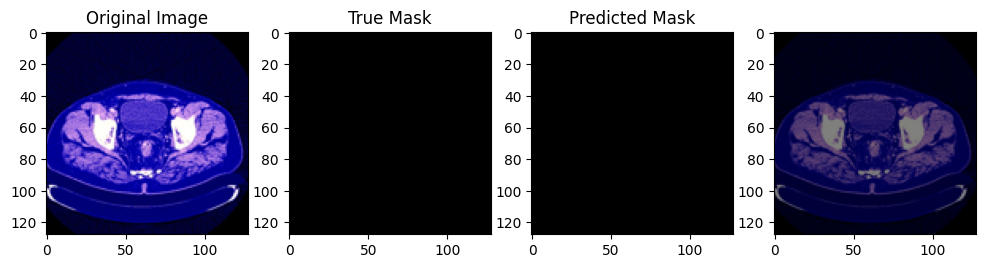

328
1/1 [==============================] - 0s 21ms/step


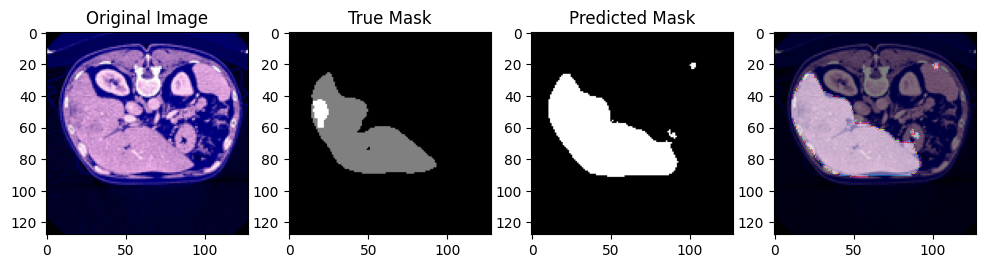

626
1/1 [==============================] - 0s 20ms/step


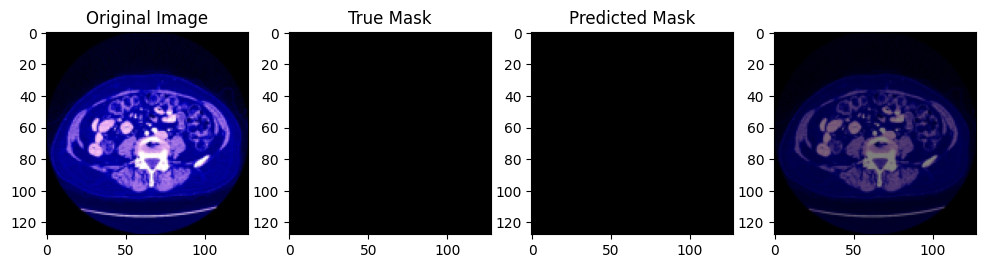

24
1/1 [==============================] - 0s 20ms/step


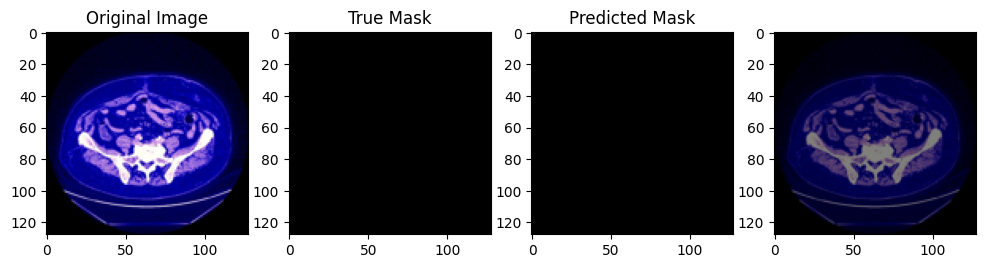

199
1/1 [==============================] - 0s 20ms/step


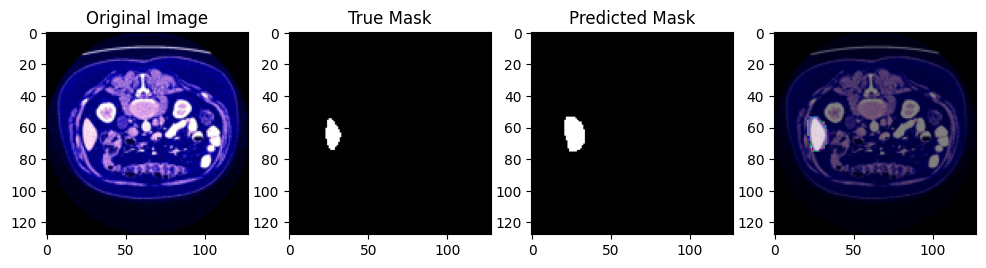

879
1/1 [==============================] - 0s 23ms/step


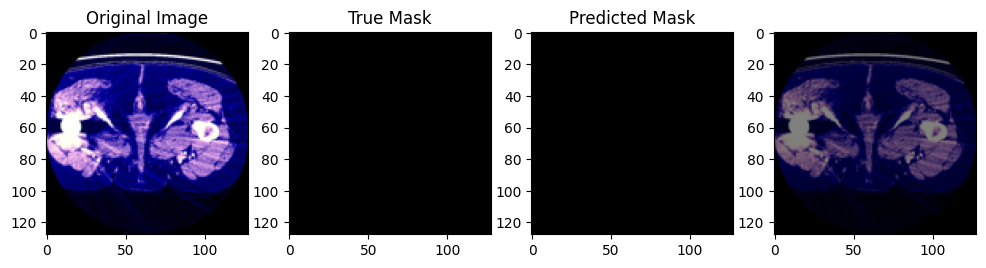

891
1/1 [==============================] - 0s 20ms/step


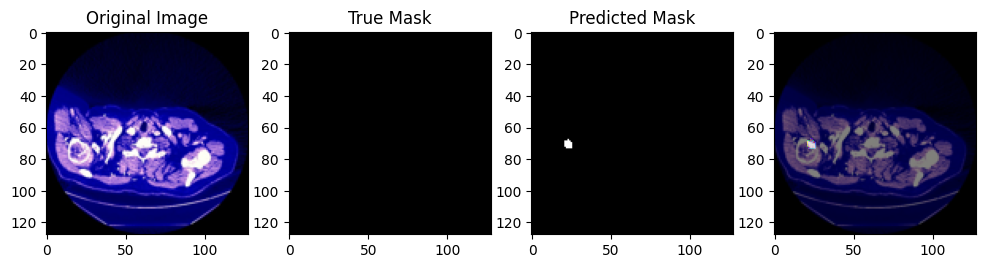

121
1/1 [==============================] - 0s 22ms/step


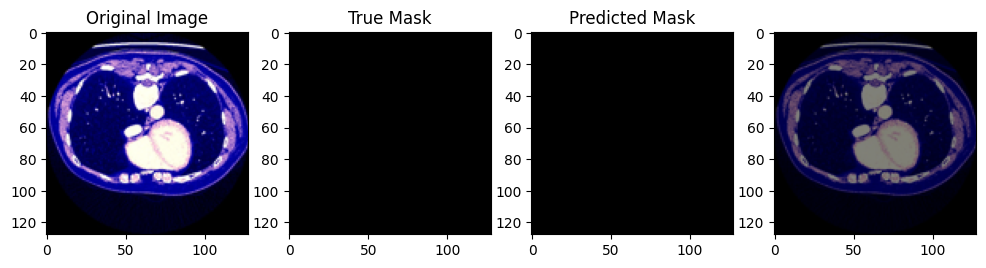

339
1/1 [==============================] - 0s 25ms/step


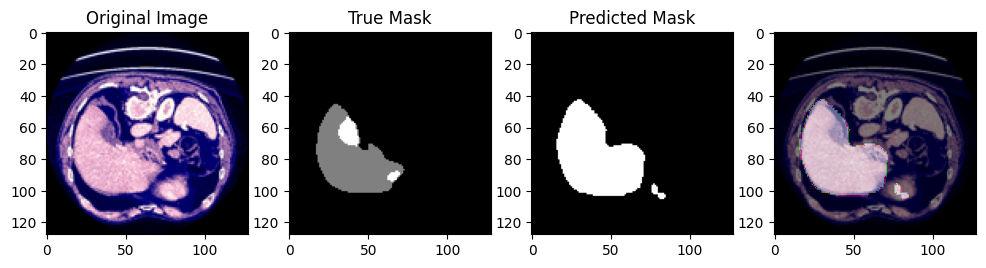

652
1/1 [==============================] - 0s 23ms/step


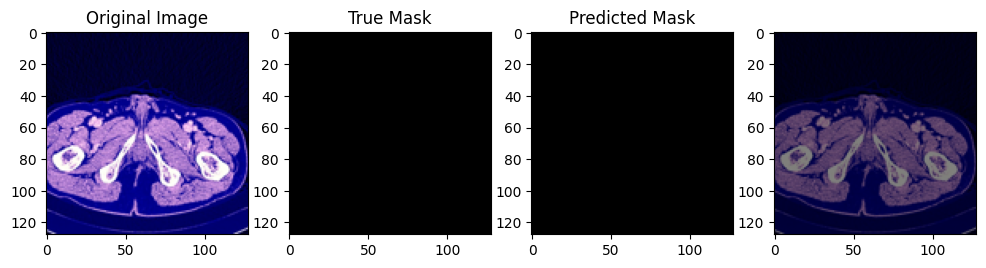

744
1/1 [==============================] - 0s 21ms/step


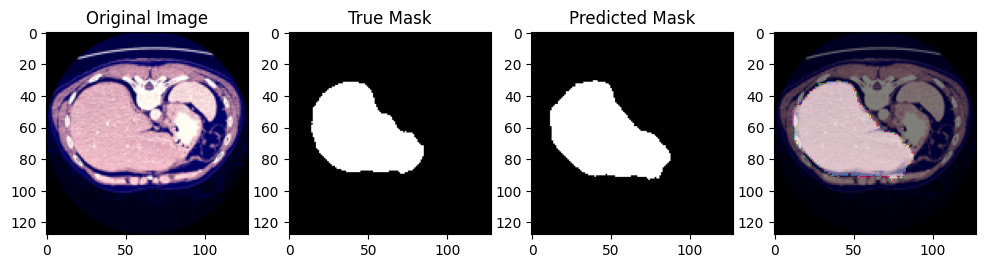

366
1/1 [==============================] - 0s 22ms/step


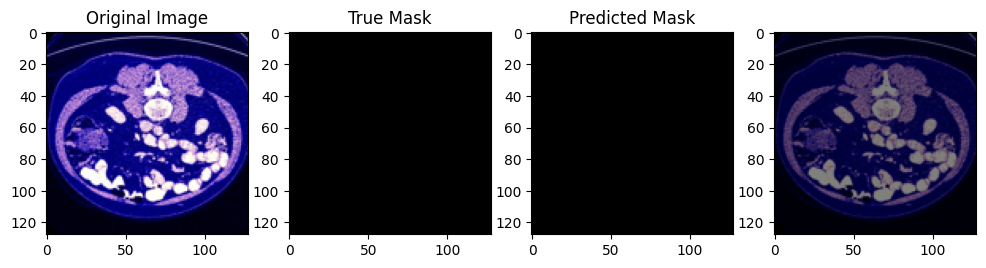

87
1/1 [==============================] - 0s 22ms/step


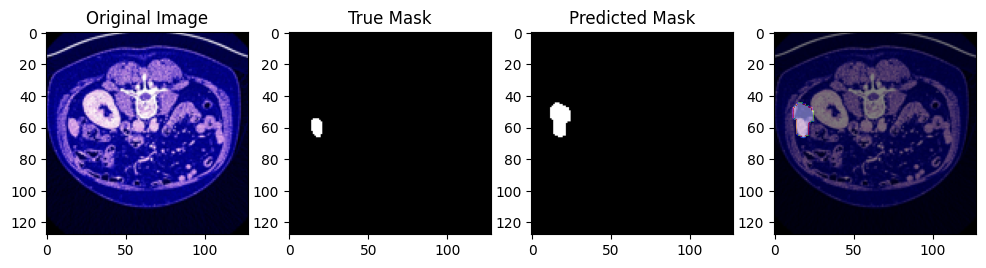

68
1/1 [==============================] - 0s 20ms/step


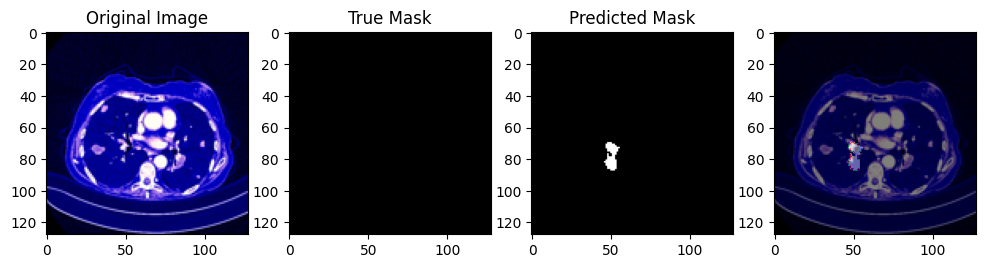

353
1/1 [==============================] - 0s 21ms/step


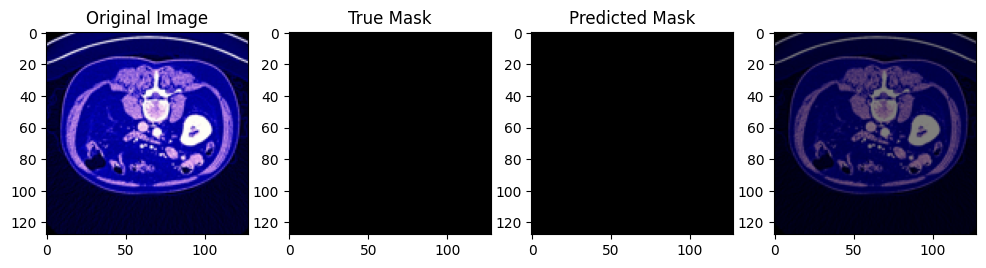

212
1/1 [==============================] - 0s 30ms/step


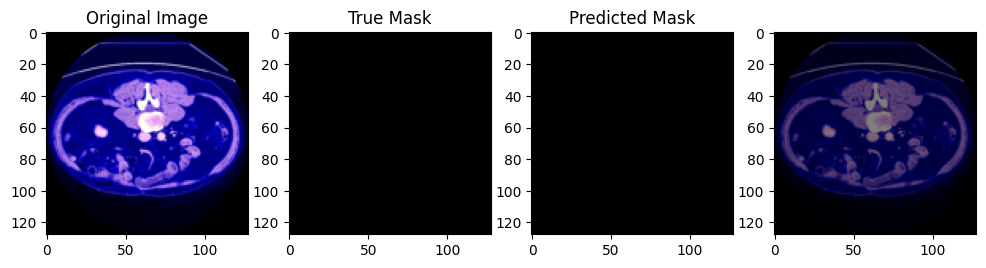

741
1/1 [==============================] - 0s 20ms/step


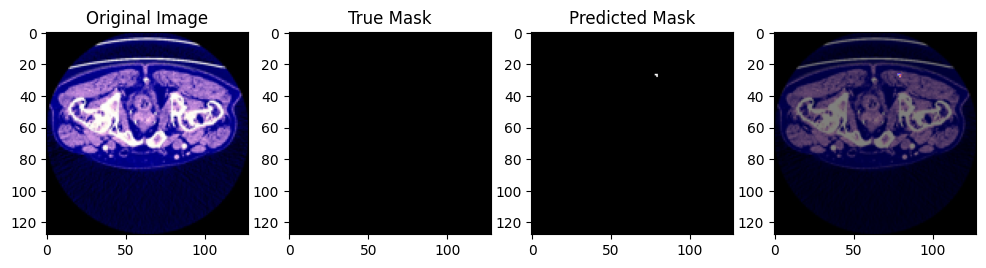

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import random
image_list=random.sample(range(1, 900), 20)
import numpy as np
np.random.seed(42)
image_list = np.random.choice(range(1, 900), 50, replace=False)


for i in (image_list):
# Assuming you have x_test and y_test
# Replace this with the actual index of the image you want to visualize
    print(i)
    image_index = i

    # Load the image and true mask
    input_image = x_valid[image_index]
    true_mask = y_valid[image_index]

    # Obtain the predicted mask from model2
    predicted_mask = model2.predict(np.expand_dims(input_image, axis=0))[0]

    # Threshold the predicted mask (assuming it's a binary mask)
    threshold = 0.5  # Adjust this threshold based on your model's output
    predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

    # Plotting
    plt.figure(figsize=(12, 4))

    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(input_image)
    plt.title('Original Image')

    # Plot true mask
    plt.subplot(1, 4, 2)
    plt.imshow(true_mask[:, :, 0], cmap='gray')
    plt.title('True Mask')

    # Plot predicted mask
    plt.subplot(1, 4, 3)
    plt.imshow(predicted_mask_binary[:, :, 0], cmap='gray')
    plt.title('Predicted Mask')
    
    plt.subplot(1,4,4)
    plt.imshow(input_image,cmap='bone')
    plt.imshow(predicted_mask_binary[:,:,0],alpha=0.5,cmap = 'nipy_spectral')

    plt.show()

In [55]:
# Step 2: Apply weights to the predictions
unet_weight = 0.98
fcn_weight = 0.71
segnet_weight = 0.99
sum_weights = unet_weight + fcn_weight + segnet_weight

w_unet = unet_weight / sum_weights
w_fcn = fcn_weight / sum_weights
w_segnet = segnet_weight / sum_weights

# Step 3: Take element-wise maximum prediction
weighted_prediction = np.maximum(w_unet * prediction1, w_fcn * prediction, w_segnet * prediction2)


In [56]:
# Step 4: Take argmax along the last axis
final_prediction = np.argmax(weighted_prediction, axis=-1)

# Step 5: Calculate the testing score using the combined predictions
test_scores1 = model2.evaluate(x_test, y_test)
test_scores2 = model1.evaluate(x_test, y_test)
weighted_test_score = w_unet * test_scores[1] + w_fcn * model.evaluate(x_test, y_test)[1] + w_segnet*test_scores1[1]

print(f'Testing score with weighted predictions: {weighted_test_score}')

29/29 [==============================] - 1s 25ms/step - loss: 1.0732 - dice_coefficient: 0.1971
Testing score with weighted predictions: 0.4912176625386103


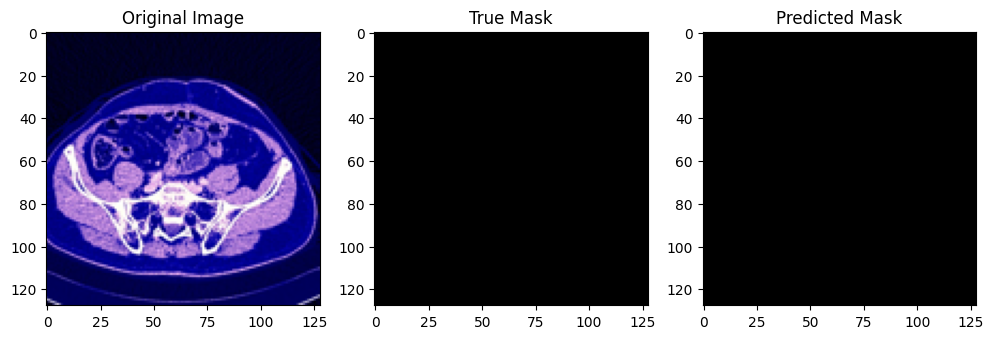

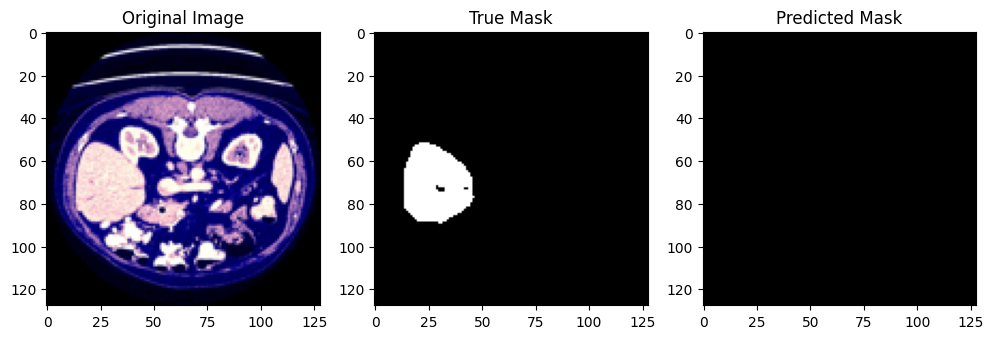

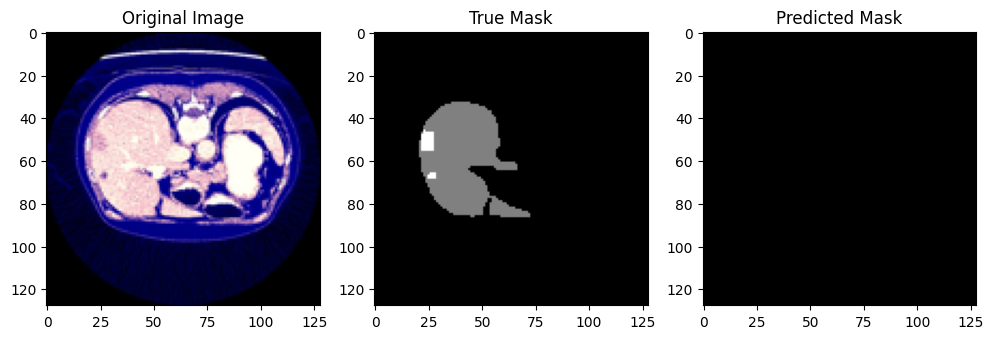

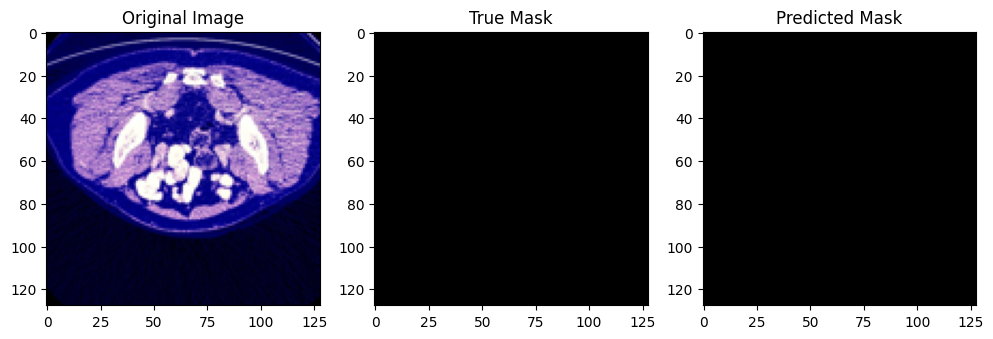

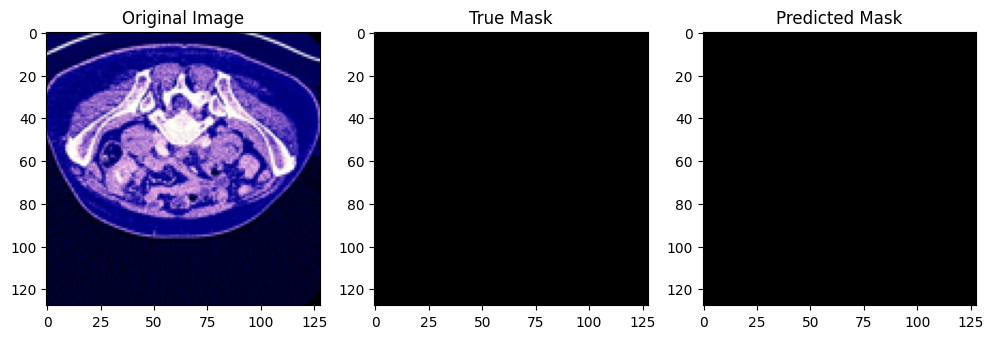

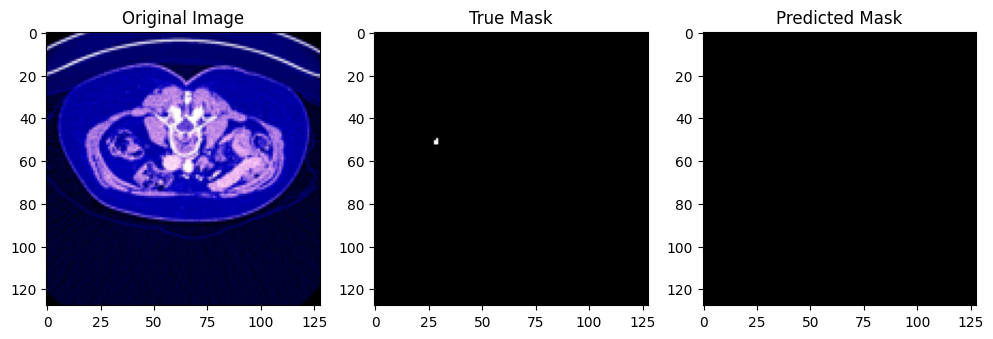

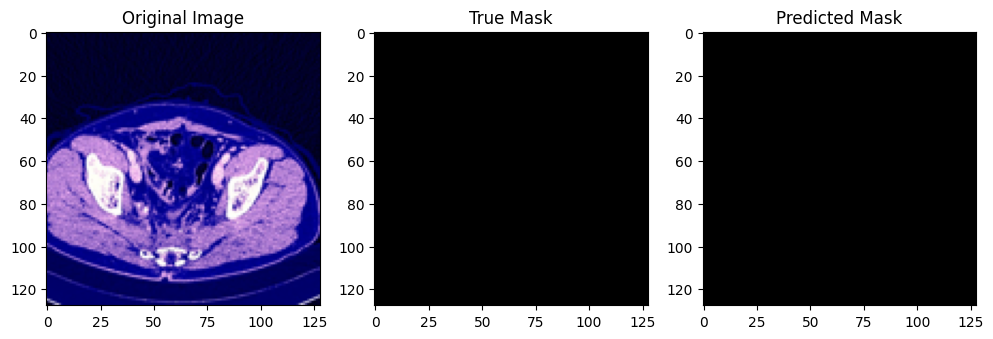

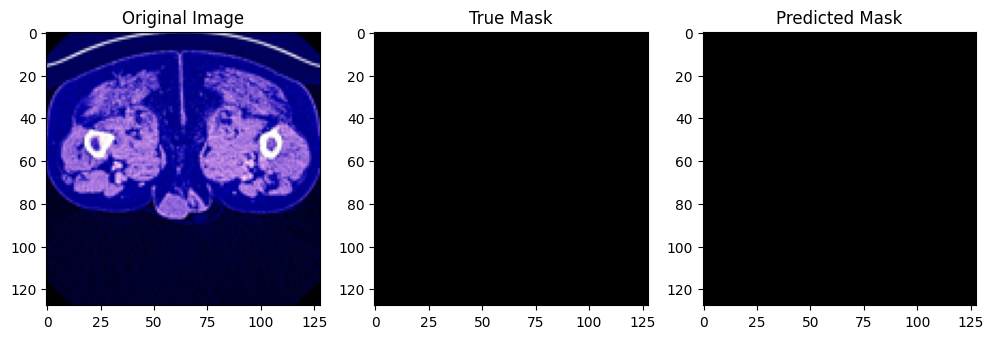

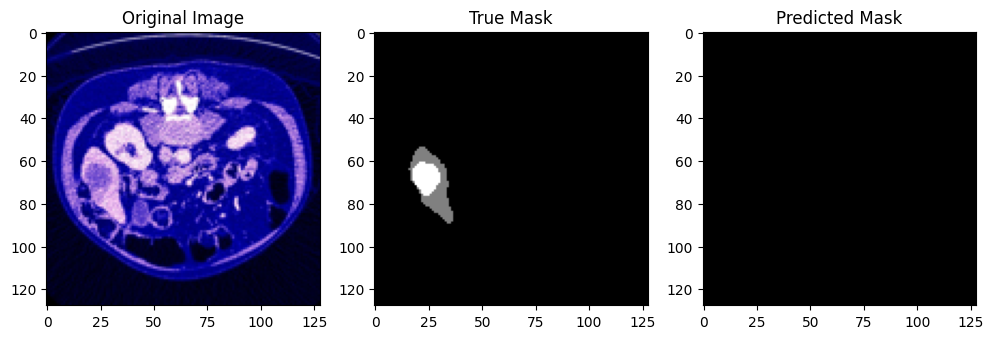

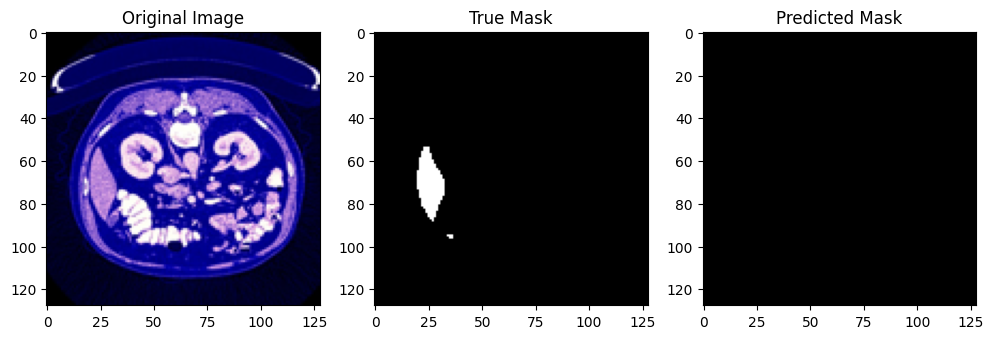

In [57]:
import matplotlib.pyplot as plt
for i in range(10):
# Assuming you have an image, true mask, and final_prediction
    image_index = i  # Adjust this based on the image you want to visualize

    # Load the image, true mask, and predicted mask
    input_image = x_test[image_index]
    true_mask = y_test[image_index]
    predicted_mask = final_prediction[image_index]

    # Plotting
    plt.figure(figsize=(12, 4))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.imshow(input_image)
    plt.title('Original Image')

    # Plot true mask
    plt.subplot(1, 3, 2)
    plt.imshow(true_mask[:, :, 0], cmap='gray')
    plt.title('True Mask')

    # Plot predicted mask
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title('Predicted Mask')

    plt.show()

In [58]:
def segnet_model(input_shape=(128, 128, 3)):
    model2 = tf.keras.Sequential()

    # Encoder
    model2.add(layers.Conv2D(64, (3, 3), padding='same', input_shape=input_shape))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Decoder
    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(256, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(128, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    model2.add(layers.UpSampling2D(size=(2, 2)))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))
    model2.add(layers.Conv2D(64, (3, 3), padding='same'))
    model2.add(layers.BatchNormalization())
    model2.add(layers.Activation('relu'))

    # Output layer
    model2.add(layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same'))

    return model2

# Create SegNet model
model2 = segnet_model(input_shape=(128, 128, 3))


# Display the model summary
model2.summary()
model2.save('segnet_model2.h5')


checkpoint = tf.keras.callbacks.ModelCheckpoint("segnet_model2.h5", monitor='val_loss', verbose=1, patience = 3,save_best_only=True,
                                                mode='auto')
checkpoint = tf.keras.callbacks.ModelCheckpoint("segnet_model2.h5", 
                                                monitor='val_loss', 
                                                verbose=1, 
                                                patience=3,
                                                save_best_only=True,
                                                mode='auto')

# Define other similar callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                  patience=5,
                                                  mode='auto',
                                                  restore_best_weights=True)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=2,
                                                 min_lr=1e-6,
                                                 mode='auto',
                                                 verbose=1)

# Combine all callbacks into a list
callbacks = [checkpoint, early_stopping, reduce_lr]

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 batch_normalization_23 (Ba  (None, 128, 128, 64)      256       
 tchNormalization)                                               
                                                                 
 activation_14 (Activation)  (None, 128, 128, 64)      0         
                                                                 
 conv2d_37 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 batch_normalization_24 (Ba  (None, 128, 128, 64)      256       
 tchNormalization)                                               
                                                                 
 activation_15 (Activation)  (None, 128, 128, 64)     

In [ ]:
tf.keras.models.save_model(model2, 'unetmodel.h7')